In [25]:
from astropy.io import fits
import glob
import os
import time 
import h5py
import numpy as np
import pandas as pd 
from astropy.wcs import WCS

from astropy.visualization import ZScaleInterval

from scipy import interpolate
from astropy import units as u
from astropy.coordinates import SkyCoord

import matplotlib.pyplot as plt 

import matplotlib

%matplotlib inline 

# from joblib import Parallel, delayed

In [2]:
def get_delay(f_l, f_h, DM):
    '''
    Calculate DM delay between two frequencies for given DM
    Args:
        f_l, f_h: float, low/high frequencies in MHz
        DM: float or int, in pc cm^3
    Returns:
        delay due to DM: float, seconds
    '''
    return 4.15*(10.**3)*(f_l**(-2.)-f_h**(-2.))*DM

def get_SB(freq):
    '''
    Return the central frequency of a LOFAR subband, for  LBA.
    Input: MHz (float) 
    Output: Subband (int)
    '''
    return int(np.floor((1024./200.)*freq))

def get_freq(SB):
    '''
    Return the LOFAR subband of a given frequency, for LBA.
    Input: Subband
    Output: MHz (float) 
    '''
    return (SB/512.)*200./2.

def get_beam(freq):
    beams = np.array([30,35,40,50,55,60,65,70,75,80,85,90])
    freq_to_use = str(beams[np.argsort(np.abs(freq-beams))[0]])

    beam_file = "/home/mkuiack1/AARTFAAC_beamsim/LBAOUTER_AARTFAAC_beamshape_{}MHz.hdf5".format(freq_to_use)
    orig =  np.array(h5py.File(beam_file, mode="r").get('lmbeamintensity_norm'))

    # Make its coordinates; x is horizontal.
    x = np.linspace(0, 2300, orig.shape[1])
    y = np.linspace(0, 2300, orig.shape[0])

    # Make the interpolator function.
    f = interpolate.interp2d(x, y, orig, kind='linear')

    # Construct the new coordinate arrays.
    x_new = np.arange(0, 2300)
    y_new = np.arange(0, 2300)

    # Do the interpolation.
    return f(x_new, y_new)


In [3]:
def get_ddfilelist(filelist, freqs, check_time, DM):
    dd_filelist = []
    for i in range(len(freqs)):
#         print pd.to_datetime(check_time)+pd.to_timedelta(np.round(get_delay(freqs[i],np.max(freqs), DM),0), unit='s')
        try:
            newfile = filelist[str(freqs[i])].loc[pd.to_datetime(check_time)
                                    +pd.to_timedelta(np.round(get_delay(freqs[i],np.max(freqs), DM),0), unit='s') ]
            if str(newfile) == 'nan' :
                newfile = filelist[str(freqs[i])].loc[pd.to_datetime(check_time)
                      +pd.to_timedelta(np.round(get_delay(freqs[i],np.max(freqs), DM),0), unit='s')-
                     +pd.to_timedelta(1, unit='s')]
            dd_filelist.append(newfile)
        except KeyError:
            try:
#                 print(pd.to_datetime(check_time)
#                       +pd.to_timedelta(np.round(get_delay(freqs[i],np.max(freqs), DM),0), unit='s')-
#                      +pd.to_timedelta(1, unit='s'))
                newfile = filelist[str(freqs[i])].loc[pd.to_datetime(check_time)
                      +pd.to_timedelta(np.round(get_delay(freqs[i],np.max(freqs), DM),0), unit='s')-
                     +pd.to_timedelta(1, unit='s')]
                dd_filelist.append(newfile)
            except KeyError:
#                 print "no"
                continue 
    return dd_filelist

def make_dedisperse_image(dd_filelist):
    
    integrated = np.zeros([1024,1024])
    
    for img in dd_filelist:
        hdu_1 = fits.open(img)[0]
#         print os.path.basename(img), np.nanstd(hdu_1.data[0,0,:,:])
        integrated += hdu_1.data[0,0,:,:]
        
    return integrated




In [4]:
all_freqs = []
slice_times = []
all_std = []

In [34]:
SB = "SB*"
SLICE = "2021-02-23T01:53:36-01:56:46"
TIME = "2021-02-23T01:53:*"
OBS = "202102230145"
basedir = "/zfs/helios/filer1/mkuiack1"

images = glob.glob(basedir+"/{}/{}_all/{}-{}/imgs/{}*.fits".format(OBS,SLICE,SB,SLICE,TIME))
print(len(images))

starttime =  time.time()
# im_stack = []
im_stack = np.zeros([2300, 2300])
count = 0 



for img_file in images:#np.random.choice(images,  1000, replace=False):

        data, f=fits.getdata(img_file, header=True)
        if f[" CRVAL3"]/1e6 == 50.:
            continue
        STD = np.std(data[0,0,500:1500,500:1500])

        all_std.append(STD)
        slice_times.append(f["DATE-OBS"])
        all_freqs.append(f[" CRVAL3"]/1e6)
        
        beam_model = get_beam(f[" CRVAL3"]/1e6)
#         psr.append(np.mean((data[0,0,:,:]/np.abs(np.median(data[0,0,:,:]))*(np.max(beam_model)/beam_model))[1675:1685,440:450]))
#         print(STD)
        if STD < 100 and STD > 5.:
#             im_stack.append(data[0,0,:,:]/np.abs(np.std(data[0,0,500:1500,500:1500])))#*(np.max(beam_model)/beam_model))    
            im_stack += data[0,0,:,:]/np.abs(np.nanstd(data[0,0,500:1500,500:1500]))#*(np.max(beam_model)/beam_model) 

            count += 1

# im_stack /= count 
print(count)
print(time.time() - starttime )


384


/home/mkuiack1/lpfenv/lib/python3.6/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in add


384
83.13427543640137


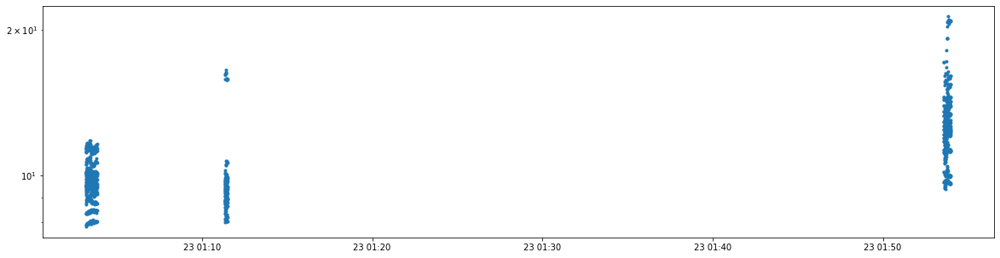

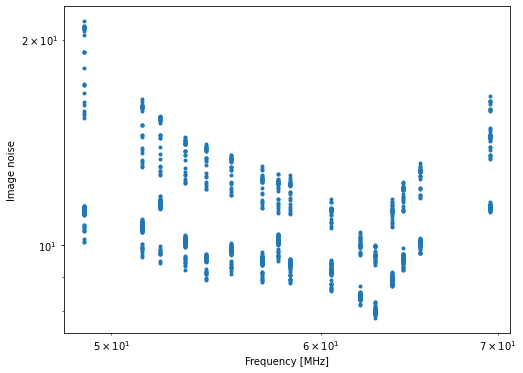

In [35]:
plt.figure(figsize=(20,5))
plt.plot(pd.to_datetime(slice_times)[np.array(all_std) < 100], 
         np.array(all_std)[np.array(all_std) < 100],".")
plt.yscale("log")
plt.yscale("log")

# plt.figure(figsize=(20,5))
# plt.plot(pd.to_datetime(slice_times), psr,".")
# plt.yscale("log")
plt.figure(figsize=(8,6))
plt.plot(np.array(all_freqs), 
         np.array(all_std),".")

plt.xlabel("Frequency [MHz]")
plt.ylabel("Image noise")
plt.xscale("log")
plt.yscale("log")
# plt.plot(np.linspace(30,65),powlaw(np.linspace(30,65),*fit))


In [36]:
hdu_1 = fits.open(img_file)[0]


wcs = WCS(hdu_1.header)
wcs = wcs.dropaxis(-1).dropaxis(-1)

spot = wcs.wcs_world2pix(148., 7.5 , 0)



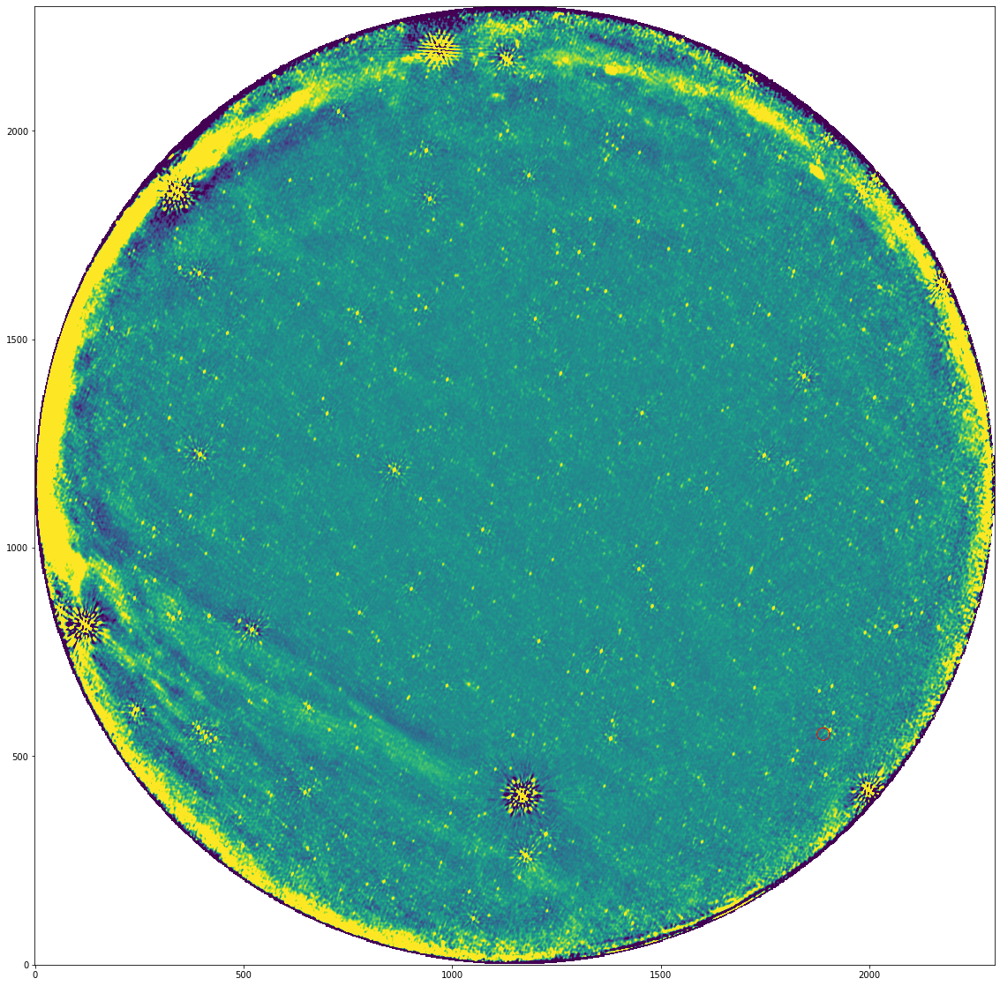

In [37]:
vmin, vmax = ZScaleInterval().get_limits(im_stack)

plt.figure(figsize=(20,20))
plt.imshow(im_stack, origin="lower",
           vmin=vmin, vmax=vmax)

plt.scatter(spot[0],spot[1], s=200,facecolor="None", color="red")

In [17]:
img = np.median(np.array(im_stack), axis=0)


In [18]:
# img = np.median(np.array(im_stack), axis=0)
vmin, vmax = ZScaleInterval().get_limits(img)

plt.figure(figsize=(20,20))
plt.imshow(img, origin="lower",
           vmin=vmin, vmax=vmax)

IndexError: index 0 is out of bounds for axis 0 with size 0

In [85]:
obs_freqs = get_freq(np.unique([os.path.basename(x)[-8:-5] for x in images]).astype(int))
obs_subbands = np.unique([os.path.basename(x)[-8:-5] for x in images]).astype(int)
obs_times = np.unique([pd.to_datetime(os.path.basename(x)[:21]) for x in images])


In [216]:
x = np.array('/opt/Archive/202008122000/2020-08-13T03:54:00-04:00:00_all/SB320-2020-08-13T03:54:00-04:00:00/imgs/2020-08-13T03:57:02.8-SB320.fits')


In [218]:
x

array('/opt/Archive/202008122000/2020-08-13T03:54:00-04:00:00_all/SB320-2020-08-13T03:54:00-04:00:00/imgs/2020-08-13T03:57:02.8-SB320.fits',
      dtype='|S131')

In [280]:
for SLICE in all_slices[::10]:

    images = glob.glob(os.path.expanduser("/opt/Archive/"
                                          +OBS+"/"+SLICE
                                          +"_all/*/imgs/*.fits"))

    obs_info = pd.DataFrame([])


    for _subband in obs_subbands:
        filenames = np.array(images)[np.array([str(_subband) in x for x in images], dtype=bool)]

        obs_info = pd.concat([obs_info, pd.DataFrame({str(_subband):[os.path.basename(x) for x in filenames]},
                index =[pd.to_datetime(os.path.basename(x)[:21]) for x in filenames])], axis=1, sort=False)

    print len(obs_info)
    if len(obs_info) == 0:
        print SLICE

91
0
2020-08-12T21:33:50-21:36:59
0
2020-08-12T22:06:50-22:09:59
0
2020-08-12T22:48:50-22:51:59
94
94
189
189
188
188
189


KeyboardInterrupt: 

In [276]:
obs_times = np.unique([pd.to_datetime(os.path.basename(x)[:21]) for x in images])

In [239]:
for i in np.arange(0,10,2):
    
    for img_file in sorted(np.append(obs_info.iloc[i].dropna(),
                                     obs_info.iloc[i+1].dropna())):
        
        print os.path.isfile("/opt/Archive/202008122000/2020-08-13T03:54:00-04:00:00_all/SB"
                             +img_file[-8:-5]
                             +"-2020-08-13T03:54:00-04:00:00/imgs/"
                             +img_file)
#         print("/opt/Archive/202008122000/2020-08-13T03:54:00-04:00:00_all/SB"
#                              +img_file[-8:-5]
#                              +"-2020-08-13T03:54:00-04:00:00/imgs/"
#                              +img_file)
    print "###############"

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
###############
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
###############
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
###############
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
###############
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
###############


In [292]:
"/opt/Archive/"+OBS+"/"+SLICE+"_all/*/imgs/*.fits"

'/opt/Archive/202008122000/2020-08-13T02:48:00-02:51:10_all/*/imgs/*.fits'

In [299]:
import multiprocessing

multiprocessing.cpu_count()

96

In [6]:
OBS = "202008122000"
SLICE = "2020-08-13T03:51:00-03:54:10"
glob.glob(os.path.expanduser("/opt/Archive/"
                                          +OBS+"/"+SLICE
                                          +"_all/*"+SLICE+"/cleaned/*.fits"))

['/opt/Archive/202008122000/2020-08-13T03:51:00-03:54:10_all/SB166-2020-08-13T03:51:00-03:54:10/cleaned/SB166-2020-08-13T03:51:00-03:54:10_CLEAN-t0085-dirty.fits',
 '/opt/Archive/202008122000/2020-08-13T03:51:00-03:54:10_all/SB166-2020-08-13T03:51:00-03:54:10/cleaned/SB166-2020-08-13T03:51:00-03:54:10_CLEAN-t0006-dirty.fits',
 '/opt/Archive/202008122000/2020-08-13T03:51:00-03:54:10_all/SB166-2020-08-13T03:51:00-03:54:10/cleaned/SB166-2020-08-13T03:51:00-03:54:10_CLEAN-t0008-image.fits',
 '/opt/Archive/202008122000/2020-08-13T03:51:00-03:54:10_all/SB166-2020-08-13T03:51:00-03:54:10/cleaned/SB166-2020-08-13T03:51:00-03:54:10_CLEAN-t0075-dirty.fits',
 '/opt/Archive/202008122000/2020-08-13T03:51:00-03:54:10_all/SB166-2020-08-13T03:51:00-03:54:10/cleaned/SB166-2020-08-13T03:51:00-03:54:10_CLEAN-t0093-dirty.fits',
 '/opt/Archive/202008122000/2020-08-13T03:51:00-03:54:10_all/SB166-2020-08-13T03:51:00-03:54:10/cleaned/SB166-2020-08-13T03:51:00-03:54:10_CLEAN-t0010-dirty.fits',
 '/opt/Archive/2

In [8]:

# SLICE = "2020-08-13T03:54:00-04:00:00"

def process_slice(SLICE):
    
    OBS = "202008122000"
    all_std = [] 
    
    
    
    images = glob.glob(os.path.expanduser("/opt/Archive/"
                                          +OBS+"/"+SLICE
                                          +"_all/*"+SLICE+"/cleaned/*.fits"))
    if len(images) == 0:
        print "no images in", SLICE
        return
    
    obs_subbands = np.unique([os.path.basename(x)[-8:-5] for x in images]).astype(int)
    obs_info = pd.DataFrame([])

    for _subband in obs_subbands:
        filenames = np.array(images)[np.array([str(_subband) in x for x in images], dtype=bool)]

        obs_info = pd.concat([obs_info, pd.DataFrame({str(_subband):[os.path.basename(x) for x in filenames]},
                index =[pd.to_datetime(os.path.basename(x)[:21]) for x in filenames])], axis=1, sort=False)

    print SLICE, len(obs_info)

    
    
#     if len(obs_info) < 100:
#     steps = np.arange(0,len(obs_info),1)
#     obs_steps = len(obs_info)

#     elif len(obs_info) > 180:
    steps = np.arange(0,len(obs_info),2)
    obs_steps = len(obs_info)
#     else:
#         print "something wrong with slice", SLICE
#         return
    try:
        for i in steps:

            starttime =  time.time()
            im_stack = np.zeros([2300, 2300])
            f_stack = []
            all_freqs = []
            slice_times = [] 

#             if obs_steps < 100:
            file_list = sorted(obs_info.iloc[i].dropna())
#             elif obs_steps > 180:
#                 file_list =sorted(np.append(obs_info.iloc[i].dropna(),
#                                              obs_info.iloc[i+1].dropna()))



            for img_file in file_list:

                file_path = "/opt/Archive/"+OBS+"/"+SLICE+"_all/SB" \
                                     +img_file[-8:-5] \
                                     +"-"+SLICE+"/cleaned/" \
                                     +img_file 

                data, f=fits.getdata(file_path, header=True)
                STD = np.std(data[0,0,:,:])

                f_stack.append(f)
                all_std.append(STD)
                slice_times.append(f["DATE-OBS"])

                if STD < 100. and STD > 10.:
                    all_freqs.append(f["CRVAL3"])
                    im_stack[:,:] += data[0,0,:,:]/np.abs(np.median(data[0,0,:,:]))


            hdul = fits.open(file_path)
            prihdr = hdul[0].header

            prihdr.update({'RESTFRQ':np.mean(all_freqs)*1e6})
            prihdr.update({'RESTFREQ':np.mean(all_freqs)*1e6})
            prihdr.update({'RESTBW':hdul[0].header['CDELT3']*len(all_freqs)})

            prihdr.update({'DATE-OBS':min(slice_times)})

            hdul[0].data[0,0,:,:] = im_stack

            if not os.path.isdir("/opt/Archive/"
                         +OBS+"/"+SLICE
                         +"_all/int_cleaned"):
                os.mkdir("/opt/Archive/"
                         +OBS+"/"+SLICE
                         +"_all/int_cleaned")

            try:
                hdul.writeto("/opt/Archive/"
                         +OBS+"/"
                         +SLICE
                         +"_all/int_cleaned/{}_{}B_CLEAN.fits".format(f_stack[0]["DATE-OBS"],
                                                               int(len(all_freqs))))
            except IOError:
                continue
    
    except IndexError:
        print SLICE, file_list[0]
        return 
    return

#         print i, round(time.time()-starttime,2)

In [7]:
# all_slices = ['2020-08-12T21:51:50-21:54:59',
# '2020-08-12T21:48:50-21:51:59',
# '2020-08-12T21:45:50-21:48:59',
# '2020-08-12T21:42:50-21:45:59',
# '2020-08-12T21:39:50-21:42:59',
# '2020-08-12T21:36:50-21:39:59',
# '2020-08-12T21:33:50-21:36:59',
# '2020-08-12T21:30:50-21:33:59',
# '2020-08-12T22:06:50-22:09:59',
# '2020-08-12T22:00:50-22:03:59',
# '2020-08-12T21:57:50-22:00:59',
# '2020-08-12T22:18:50-22:21:59',
# '2020-08-12T22:24:50-22:30:59',
# '2020-08-12T22:57:50-23:00:59',
# '2020-08-12T22:54:50-22:57:59',
# '2020-08-12T22:51:50-22:54:59',
# '2020-08-12T22:48:50-22:51:59',
# '2020-08-12T22:45:50-22:48:59']

all_slices = ["2020-08-13T03:51:00-03:54:10"]

In [9]:
_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])

JoblibValueError: JoblibValueError
___________________________________________________________________________
...........................................................................
/usr/lib/python2.7/runpy.py in _run_module_as_main(mod_name='ipykernel_launcher', alter_argv=1)
    169     pkg_name = mod_name.rpartition('.')[0]
    170     main_globals = sys.modules["__main__"].__dict__
    171     if alter_argv:
    172         sys.argv[0] = fname
    173     return _run_code(code, main_globals, None,
--> 174                      "__main__", fname, loader, pkg_name)
        fname = '/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py'
        loader = <pkgutil.ImpLoader instance>
        pkg_name = ''
    175 
    176 def run_module(mod_name, init_globals=None,
    177                run_name=None, alter_sys=False):
    178     """Execute a module's code without importing it

...........................................................................
/usr/lib/python2.7/runpy.py in _run_code(code=<code object <module> at 0x7fcf2a6f2f30, file "/...2.7/site-packages/ipykernel_launcher.py", line 5>, run_globals={'__builtins__': <module '__builtin__' (built-in)>, '__doc__': 'Entry point for launching an IPython kernel.\n\nTh...orts until\nafter removing the cwd from sys.path.\n', '__file__': '/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py', '__loader__': <pkgutil.ImpLoader instance>, '__name__': '__main__', '__package__': '', 'app': <module 'ipykernel.kernelapp' from '/home/mkuiac...python2.7/site-packages/ipykernel/kernelapp.pyc'>, 'sys': <module 'sys' (built-in)>}, init_globals=None, mod_name='__main__', mod_fname='/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py', mod_loader=<pkgutil.ImpLoader instance>, pkg_name='')
     67         run_globals.update(init_globals)
     68     run_globals.update(__name__ = mod_name,
     69                        __file__ = mod_fname,
     70                        __loader__ = mod_loader,
     71                        __package__ = pkg_name)
---> 72     exec code in run_globals
        code = <code object <module> at 0x7fcf2a6f2f30, file "/...2.7/site-packages/ipykernel_launcher.py", line 5>
        run_globals = {'__builtins__': <module '__builtin__' (built-in)>, '__doc__': 'Entry point for launching an IPython kernel.\n\nTh...orts until\nafter removing the cwd from sys.path.\n', '__file__': '/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py', '__loader__': <pkgutil.ImpLoader instance>, '__name__': '__main__', '__package__': '', 'app': <module 'ipykernel.kernelapp' from '/home/mkuiac...python2.7/site-packages/ipykernel/kernelapp.pyc'>, 'sys': <module 'sys' (built-in)>}
     73     return run_globals
     74 
     75 def _run_module_code(code, init_globals=None,
     76                     mod_name=None, mod_fname=None,

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py in <module>()
     11     # This is added back by InteractiveShellApp.init_path()
     12     if sys.path[0] == '':
     13         del sys.path[0]
     14 
     15     from ipykernel import kernelapp as app
---> 16     app.launch_new_instance()

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/traitlets/config/application.py in launch_instance(cls=<class 'ipykernel.kernelapp.IPKernelApp'>, argv=None, **kwargs={})
    659 
    660         If a global instance already exists, this reinitializes and starts it
    661         """
    662         app = cls.instance(**kwargs)
    663         app.initialize(argv)
--> 664         app.start()
        app.start = <bound method IPKernelApp.start of <ipykernel.kernelapp.IPKernelApp object>>
    665 
    666 #-----------------------------------------------------------------------------
    667 # utility functions, for convenience
    668 #-----------------------------------------------------------------------------

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel/kernelapp.py in start(self=<ipykernel.kernelapp.IPKernelApp object>)
    494         if self.poller is not None:
    495             self.poller.start()
    496         self.kernel.start()
    497         self.io_loop = ioloop.IOLoop.current()
    498         try:
--> 499             self.io_loop.start()
        self.io_loop.start = <bound method ZMQIOLoop.start of <zmq.eventloop.ioloop.ZMQIOLoop object>>
    500         except KeyboardInterrupt:
    501             pass
    502 
    503 launch_new_instance = IPKernelApp.launch_instance

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/tornado/ioloop.py in start(self=<zmq.eventloop.ioloop.ZMQIOLoop object>)
   1068                 self._events.update(event_pairs)
   1069                 while self._events:
   1070                     fd, events = self._events.popitem()
   1071                     try:
   1072                         fd_obj, handler_func = self._handlers[fd]
-> 1073                         handler_func(fd_obj, events)
        handler_func = <function null_wrapper>
        fd_obj = <zmq.sugar.socket.Socket object>
        events = 1
   1074                     except (OSError, IOError) as e:
   1075                         if errno_from_exception(e) == errno.EPIPE:
   1076                             # Happens when the client closes the connection
   1077                             pass

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/tornado/stack_context.py in null_wrapper(*args=(<zmq.sugar.socket.Socket object>, 1), **kwargs={})
    295         # Fast path when there are no active contexts.
    296         def null_wrapper(*args, **kwargs):
    297             try:
    298                 current_state = _state.contexts
    299                 _state.contexts = cap_contexts[0]
--> 300                 return fn(*args, **kwargs)
        args = (<zmq.sugar.socket.Socket object>, 1)
        kwargs = {}
    301             finally:
    302                 _state.contexts = current_state
    303         null_wrapper._wrapped = True
    304         return null_wrapper

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py in _handle_events(self=<zmq.eventloop.zmqstream.ZMQStream object>, fd=<zmq.sugar.socket.Socket object>, events=1)
    451             return
    452         zmq_events = self.socket.EVENTS
    453         try:
    454             # dispatch events:
    455             if zmq_events & zmq.POLLIN and self.receiving():
--> 456                 self._handle_recv()
        self._handle_recv = <bound method ZMQStream._handle_recv of <zmq.eventloop.zmqstream.ZMQStream object>>
    457                 if not self.socket:
    458                     return
    459             if zmq_events & zmq.POLLOUT and self.sending():
    460                 self._handle_send()

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py in _handle_recv(self=<zmq.eventloop.zmqstream.ZMQStream object>)
    481             else:
    482                 raise
    483         else:
    484             if self._recv_callback:
    485                 callback = self._recv_callback
--> 486                 self._run_callback(callback, msg)
        self._run_callback = <bound method ZMQStream._run_callback of <zmq.eventloop.zmqstream.ZMQStream object>>
        callback = <function null_wrapper>
        msg = [<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>]
    487         
    488 
    489     def _handle_send(self):
    490         """Handle a send event."""

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py in _run_callback(self=<zmq.eventloop.zmqstream.ZMQStream object>, callback=<function null_wrapper>, *args=([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],), **kwargs={})
    433         """Wrap running callbacks in try/except to allow us to
    434         close our socket."""
    435         try:
    436             # Use a NullContext to ensure that all StackContexts are run
    437             # inside our blanket exception handler rather than outside.
--> 438             callback(*args, **kwargs)
        callback = <function null_wrapper>
        args = ([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],)
        kwargs = {}
    439         except:
    440             gen_log.error("Uncaught exception in ZMQStream callback",
    441                           exc_info=True)
    442             # Re-raise the exception so that IOLoop.handle_callback_exception

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/tornado/stack_context.py in null_wrapper(*args=([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],), **kwargs={})
    295         # Fast path when there are no active contexts.
    296         def null_wrapper(*args, **kwargs):
    297             try:
    298                 current_state = _state.contexts
    299                 _state.contexts = cap_contexts[0]
--> 300                 return fn(*args, **kwargs)
        args = ([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],)
        kwargs = {}
    301             finally:
    302                 _state.contexts = current_state
    303         null_wrapper._wrapped = True
    304         return null_wrapper

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel/kernelbase.py in dispatcher(msg=[<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>])
    278         if self.control_stream:
    279             self.control_stream.on_recv(self.dispatch_control, copy=False)
    280 
    281         def make_dispatcher(stream):
    282             def dispatcher(msg):
--> 283                 return self.dispatch_shell(stream, msg)
        msg = [<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>]
    284             return dispatcher
    285 
    286         for s in self.shell_streams:
    287             s.on_recv(make_dispatcher(s), copy=False)

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel/kernelbase.py in dispatch_shell(self=<ipykernel.ipkernel.IPythonKernel object>, stream=<zmq.eventloop.zmqstream.ZMQStream object>, msg={'buffers': [], 'content': {u'allow_stdin': True, u'code': u'_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])', u'silent': False, u'stop_on_error': True, u'store_history': True, u'user_expressions': {}}, 'header': {u'date': datetime.datetime(2020, 11, 19, 10, 7, 42, 906271, tzinfo=tzlocal()), u'msg_id': u'8390fea95a894a3f8ee762a0cd9e9be0', u'msg_type': u'execute_request', u'session': u'bdd2894ac08e471ea940a6dcc788f4e0', u'username': u'username', u'version': u'5.2'}, 'metadata': {}, 'msg_id': u'8390fea95a894a3f8ee762a0cd9e9be0', 'msg_type': u'execute_request', 'parent_header': {}})
    228             self.log.warning("Unknown message type: %r", msg_type)
    229         else:
    230             self.log.debug("%s: %s", msg_type, msg)
    231             self.pre_handler_hook()
    232             try:
--> 233                 handler(stream, idents, msg)
        handler = <bound method IPythonKernel.execute_request of <ipykernel.ipkernel.IPythonKernel object>>
        stream = <zmq.eventloop.zmqstream.ZMQStream object>
        idents = ['bdd2894ac08e471ea940a6dcc788f4e0']
        msg = {'buffers': [], 'content': {u'allow_stdin': True, u'code': u'_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])', u'silent': False, u'stop_on_error': True, u'store_history': True, u'user_expressions': {}}, 'header': {u'date': datetime.datetime(2020, 11, 19, 10, 7, 42, 906271, tzinfo=tzlocal()), u'msg_id': u'8390fea95a894a3f8ee762a0cd9e9be0', u'msg_type': u'execute_request', u'session': u'bdd2894ac08e471ea940a6dcc788f4e0', u'username': u'username', u'version': u'5.2'}, 'metadata': {}, 'msg_id': u'8390fea95a894a3f8ee762a0cd9e9be0', 'msg_type': u'execute_request', 'parent_header': {}}
    234             except Exception:
    235                 self.log.error("Exception in message handler:", exc_info=True)
    236             finally:
    237                 self.post_handler_hook()

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel/kernelbase.py in execute_request(self=<ipykernel.ipkernel.IPythonKernel object>, stream=<zmq.eventloop.zmqstream.ZMQStream object>, ident=['bdd2894ac08e471ea940a6dcc788f4e0'], parent={'buffers': [], 'content': {u'allow_stdin': True, u'code': u'_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])', u'silent': False, u'stop_on_error': True, u'store_history': True, u'user_expressions': {}}, 'header': {u'date': datetime.datetime(2020, 11, 19, 10, 7, 42, 906271, tzinfo=tzlocal()), u'msg_id': u'8390fea95a894a3f8ee762a0cd9e9be0', u'msg_type': u'execute_request', u'session': u'bdd2894ac08e471ea940a6dcc788f4e0', u'username': u'username', u'version': u'5.2'}, 'metadata': {}, 'msg_id': u'8390fea95a894a3f8ee762a0cd9e9be0', 'msg_type': u'execute_request', 'parent_header': {}})
    394         if not silent:
    395             self.execution_count += 1
    396             self._publish_execute_input(code, parent, self.execution_count)
    397 
    398         reply_content = self.do_execute(code, silent, store_history,
--> 399                                         user_expressions, allow_stdin)
        user_expressions = {}
        allow_stdin = True
    400 
    401         # Flush output before sending the reply.
    402         sys.stdout.flush()
    403         sys.stderr.flush()

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel/ipkernel.py in do_execute(self=<ipykernel.ipkernel.IPythonKernel object>, code=u'_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])', silent=False, store_history=True, user_expressions={}, allow_stdin=True)
    203 
    204         self._forward_input(allow_stdin)
    205 
    206         reply_content = {}
    207         try:
--> 208             res = shell.run_cell(code, store_history=store_history, silent=silent)
        res = undefined
        shell.run_cell = <bound method ZMQInteractiveShell.run_cell of <ipykernel.zmqshell.ZMQInteractiveShell object>>
        code = u'_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])'
        store_history = True
        silent = False
    209         finally:
    210             self._restore_input()
    211 
    212         if res.error_before_exec is not None:

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel/zmqshell.py in run_cell(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, *args=(u'_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])',), **kwargs={'silent': False, 'store_history': True})
    532             )
    533         self.payload_manager.write_payload(payload)
    534 
    535     def run_cell(self, *args, **kwargs):
    536         self._last_traceback = None
--> 537         return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
        self.run_cell = <bound method ZMQInteractiveShell.run_cell of <ipykernel.zmqshell.ZMQInteractiveShell object>>
        args = (u'_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])',)
        kwargs = {'silent': False, 'store_history': True}
    538 
    539     def _showtraceback(self, etype, evalue, stb):
    540         # try to preserve ordering of tracebacks and print statements
    541         sys.stdout.flush()

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/IPython/core/interactiveshell.py in run_cell(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, raw_cell=u'_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])', store_history=True, silent=False, shell_futures=True)
   2709                 self.displayhook.exec_result = result
   2710 
   2711                 # Execute the user code
   2712                 interactivity = "none" if silent else self.ast_node_interactivity
   2713                 has_raised = self.run_ast_nodes(code_ast.body, cell_name,
-> 2714                    interactivity=interactivity, compiler=compiler, result=result)
        interactivity = 'last_expr'
        compiler = <IPython.core.compilerop.CachingCompiler instance>
   2715                 
   2716                 self.last_execution_succeeded = not has_raised
   2717 
   2718                 # Reset this so later displayed values do not modify the

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/IPython/core/interactiveshell.py in run_ast_nodes(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, nodelist=[<_ast.Assign object>], cell_name='<ipython-input-9-79289476bc5a>', interactivity='none', compiler=<IPython.core.compilerop.CachingCompiler instance>, result=<ExecutionResult object at 7fcef79e0e90, executi..._before_exec=None error_in_exec=None result=None>)
   2813 
   2814         try:
   2815             for i, node in enumerate(to_run_exec):
   2816                 mod = ast.Module([node])
   2817                 code = compiler(mod, cell_name, "exec")
-> 2818                 if self.run_code(code, result):
        self.run_code = <bound method ZMQInteractiveShell.run_code of <ipykernel.zmqshell.ZMQInteractiveShell object>>
        code = <code object <module> at 0x7fcef792dd30, file "<ipython-input-9-79289476bc5a>", line 1>
        result = <ExecutionResult object at 7fcef79e0e90, executi..._before_exec=None error_in_exec=None result=None>
   2819                     return True
   2820 
   2821             for i, node in enumerate(to_run_interactive):
   2822                 mod = ast.Interactive([node])

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/IPython/core/interactiveshell.py in run_code(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, code_obj=<code object <module> at 0x7fcef792dd30, file "<ipython-input-9-79289476bc5a>", line 1>, result=<ExecutionResult object at 7fcef79e0e90, executi..._before_exec=None error_in_exec=None result=None>)
   2873         outflag = 1  # happens in more places, so it's easier as default
   2874         try:
   2875             try:
   2876                 self.hooks.pre_run_code_hook()
   2877                 #rprint('Running code', repr(code_obj)) # dbg
-> 2878                 exec(code_obj, self.user_global_ns, self.user_ns)
        code_obj = <code object <module> at 0x7fcef792dd30, file "<ipython-input-9-79289476bc5a>", line 1>
        self.user_global_ns = {'In': ['', u'from astropy.io import fits\nimport glob\nimpo...s as pd \n\nfrom joblib import Parallel, delayed', u"def get_delay(f_l, f_h, DM):\n    '''Calculate... (float) \n    '''\n    return (SB/512.)*200./2.", u'os.system("taskset -p --cpu-list 0-96 %d" % os.getpid())', u'multiprocessing.cpu_count()', u'import multiprocessing\nmultiprocessing.cpu_count()', u'OBS = "202008122000"\nSLICE = "2020-08-13T03:5...             +"_all/*"+SLICE+"/cleaned/*.fits"))', u'# all_slices = [\'2020-08-12T21:51:50-21:54:59...n\nall_slices = ["2020-08-13T03:51:00-03:54:10"]', u'\n# SLICE = "2020-08-13T03:54:00-04:00:00"\n\n...         print i, round(time.time()-starttime,2)', u'_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])'], 'OBS': '202008122000', 'Out': {3: 0, 5: 96, 6: ['/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0085-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0006-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0008-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0075-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0093-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0010-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0063-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0024-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0057-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0059-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0032-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0041-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0037-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0039-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0044-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0021-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0052-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0015-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0066-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0068-dirty.fits', ...]}, 'Parallel': <class 'joblib.parallel.Parallel'>, 'SLICE': '2020-08-13T03:51:00-03:54:10', '_': ['/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0085-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0006-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0008-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0075-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0093-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0010-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0063-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0024-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0057-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0059-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0032-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0041-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0037-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0039-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0044-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0021-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0052-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0015-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0066-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0068-dirty.fits', ...], '_3': 0, '_5': 96, '_6': ['/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0085-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0006-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0008-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0075-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0093-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0010-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0063-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0024-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0057-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0059-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0032-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0041-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0037-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0039-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0044-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0021-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0052-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0015-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0066-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0068-dirty.fits', ...], '__': 96, ...}
        self.user_ns = {'In': ['', u'from astropy.io import fits\nimport glob\nimpo...s as pd \n\nfrom joblib import Parallel, delayed', u"def get_delay(f_l, f_h, DM):\n    '''Calculate... (float) \n    '''\n    return (SB/512.)*200./2.", u'os.system("taskset -p --cpu-list 0-96 %d" % os.getpid())', u'multiprocessing.cpu_count()', u'import multiprocessing\nmultiprocessing.cpu_count()', u'OBS = "202008122000"\nSLICE = "2020-08-13T03:5...             +"_all/*"+SLICE+"/cleaned/*.fits"))', u'# all_slices = [\'2020-08-12T21:51:50-21:54:59...n\nall_slices = ["2020-08-13T03:51:00-03:54:10"]', u'\n# SLICE = "2020-08-13T03:54:00-04:00:00"\n\n...         print i, round(time.time()-starttime,2)', u'_out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])'], 'OBS': '202008122000', 'Out': {3: 0, 5: 96, 6: ['/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0085-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0006-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0008-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0075-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0093-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0010-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0063-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0024-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0057-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0059-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0032-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0041-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0037-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0039-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0044-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0021-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0052-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0015-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0066-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0068-dirty.fits', ...]}, 'Parallel': <class 'joblib.parallel.Parallel'>, 'SLICE': '2020-08-13T03:51:00-03:54:10', '_': ['/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0085-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0006-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0008-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0075-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0093-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0010-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0063-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0024-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0057-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0059-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0032-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0041-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0037-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0039-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0044-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0021-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0052-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0015-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0066-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0068-dirty.fits', ...], '_3': 0, '_5': 96, '_6': ['/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0085-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0006-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0008-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0075-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0093-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0010-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0063-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0024-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0057-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0059-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0032-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0041-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0037-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0039-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0044-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0021-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0052-dirty.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0015-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0066-image.fits', '/opt/Archive/202008122000/2020-08-13T03:51:00-03...20-08-13T03:51:00-03:54:10_CLEAN-t0068-dirty.fits', ...], '__': 96, ...}
   2879             finally:
   2880                 # Reset our crash handler in place
   2881                 sys.excepthook = old_excepthook
   2882         except SystemExit as e:

...........................................................................
/home/mkuiack1/<ipython-input-9-79289476bc5a> in <module>()
----> 1 _out = Parallel(n_jobs=21)(delayed(process_slice)(SLICE) for SLICE in all_slices[::-1])

...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/joblib/parallel.py in __call__(self=Parallel(n_jobs=21), iterable=<generator object <genexpr>>)
   1012                 # No need to wait for async callbacks to trigger to
   1013                 # consumption.
   1014                 self._iterating = False
   1015 
   1016             with self._backend.retrieval_context():
-> 1017                 self.retrieve()
        self.retrieve = <bound method Parallel.retrieve of Parallel(n_jobs=21)>
   1018             # Make sure that we get a last message telling us we are done
   1019             elapsed_time = time.time() - self._start_time
   1020             self._print('Done %3i out of %3i | elapsed: %s finished',
   1021                         (len(self._output), len(self._output),

---------------------------------------------------------------------------
Joblib worker traceback:
---------------------------------------------------------------------------
ValueError                                         Thu Nov 19 10:07:45 2020
PID: 80477                    Python 2.7.15+: /home/mkuiack1/env/bin/python
...........................................................................
/home/mkuiack1/env/lib/python2.7/site-packages/joblib/parallel.py in __call__(self=<joblib.parallel.BatchedCalls object>)
    251     def __call__(self):
    252         # Set the default nested backend to self._backend but do not set the
    253         # change the default number of processes to -1
    254         with parallel_backend(self._backend, n_jobs=self._n_jobs):
    255             return [func(*args, **kwargs)
--> 256                     for func, args, kwargs in self.items]
        func = <function process_slice>
        args = ('2020-08-13T03:51:00-03:54:10',)
        kwargs = {}
        self.items = [(<function process_slice>, ('2020-08-13T03:51:00-03:54:10',), {})]
    257 
    258     def __len__(self):
    259         return self._size
    260 

...........................................................................
/home/mkuiack1/<ipython-input-8-c84539b1e90a> in process_slice(SLICE='2020-08-13T03:51:00-03:54:10')

ValueError: invalid literal for int() with base 10: 'age'
___________________________________________________________________________

In [17]:
process_slice("2020-08-12T23:57:50-00:00:59")

2020-08-12T23:57:50-00:00:59 106


In [4]:
os.system("taskset -p --cpu-list 0-96 %d" % os.getpid())

0

15


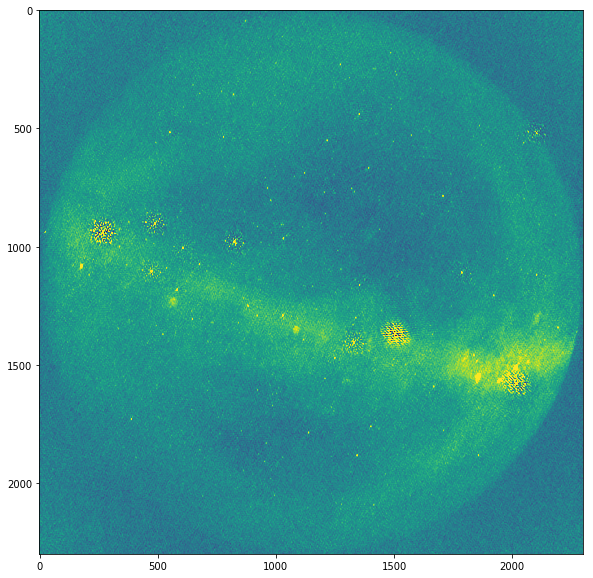

In [263]:
plt.figure(figsize=(10,10))
plt.imshow(im_stack, 
           vmin=np.mean(im_stack)-5*np.std(im_stack),
           vmax=np.mean(im_stack)+5*np.std(im_stack) )
print len(all_freqs)

In [156]:
hdul = fits.open("/opt/Archive/202008122000/2020-08-13T03:54:00-04:00:00_all/SB320-2020-08-13T03:54:00-04:00:00/imgs/2020-08-13T03:56:58.7-SB320.fits")
prihdr = hdul[0].header

In [37]:
hdul = fits.open(step_imgs[i])
prihdr = hdul[0].header

# Don't know which of these is needed
prihdr.update({'RESTFRQ':np.mean(f_stack)*1e6})
prihdr.update({'RESTFREQ':np.mean(f_stack)*1e6})

prihdr.update({'RESTBW':hdul[0].header['CDELT3']*len(f_stack)})

# These should be fit/written by WSClean
prihdr.update({'BMIN':0.2})
prihdr.update({'BMAJ':0.2})

hdul[0].data[0,0,:,:] = np.nanmean(im_stack, axis=2)

#         hdul.writeto("/scratch/mkuiack/lookhere/{}_int.fits".format(f["DATE-OBS"]))   
hdul.writeto("/opt/Archive/202007231100/{}_all/integrated/{}_int.fits".format(_slice, step))



In [4]:
from scipy.stats import sigmaclip
import time

In [8]:
t1 = time.time()

im_file = "/hddstore/mkuiack1/test_imgs/2020-12-14T02:05:38.4-SB320.fits"
hdul = fits.open(im_file)

clipped = sigmaclip(hdul[0].data)
print time.time() - t1

0.152088880539


In [36]:
# print get_freq(get_SB(78.124))
print get_freq(298.3)

58.26171875


In [5]:
all_slices = ["2020-08-12T21:03:50-21:06:59",
"2020-08-12T21:06:50-21:09:59",
"2020-08-12T21:09:50-21:12:59",
"2020-08-12T21:12:50-21:15:59",
"2020-08-12T21:15:50-21:18:59",
"2020-08-12T21:18:50-21:21:59",
"2020-08-12T21:21:50-21:24:59",
"2020-08-12T21:24:50-21:27:59",
"2020-08-12T21:27:50-21:30:59",
"2020-08-12T21:30:50-21:33:59",
"2020-08-12T21:33:50-21:36:59",
"2020-08-12T21:36:50-21:39:59",
"2020-08-12T21:39:50-21:42:59",
"2020-08-12T21:42:50-21:45:59",
"2020-08-12T21:45:50-21:48:59",
"2020-08-12T21:48:50-21:51:59",
"2020-08-12T21:51:50-21:54:59",
"2020-08-12T21:54:50-21:57:59",
"2020-08-12T21:57:50-22:00:59",
"2020-08-12T22:00:50-22:03:59",
"2020-08-12T22:06:50-22:09:59",
"2020-08-12T22:09:50-22:12:59",
"2020-08-12T22:12:50-22:15:59",
"2020-08-12T22:15:50-22:18:59",
"2020-08-12T22:18:50-22:21:59",
"2020-08-12T22:21:50-22:24:59",
"2020-08-12T22:24:50-22:27:59",
"2020-08-12T22:24:50-22:30:59",
"2020-08-12T22:27:50-22:30:59",
"2020-08-12T22:45:50-22:48:59",
"2020-08-12T22:48:50-22:51:59",
"2020-08-12T22:51:50-22:54:59",
"2020-08-12T22:54:50-22:57:59",
"2020-08-12T22:57:50-23:00:59",
"2020-08-12T23:00:50-23:03:59",
"2020-08-12T23:03:50-23:06:59",
"2020-08-12T23:06:50-23:09:59",
"2020-08-12T23:09:50-23:12:59",
"2020-08-12T23:12:50-23:15:59",
"2020-08-12T23:15:50-23:18:59",
"2020-08-12T23:18:50-23:21:59",
"2020-08-12T23:21:50-23:24:59",
"2020-08-12T23:24:50-23:27:59",
"2020-08-12T23:27:50-23:30:59",
"2020-08-12T23:30:50-23:33:59",
"2020-08-12T23:33:50-23:36:59",
"2020-08-12T23:36:50-23:39:59",
"2020-08-12T23:39:50-23:42:59",
"2020-08-12T23:42:50-23:45:59",
"2020-08-12T23:45:50-23:48:59",
"2020-08-12T23:48:50-23:51:59",
"2020-08-12T23:51:50-23:54:59",
"2020-08-12T23:54:50-23:57:59",
"2020-08-12T23:57:50-00:00:59",
"2020-08-13T00:00:00-00:03:10",
"2020-08-13T00:03:00-00:06:10",
"2020-08-13T00:06:00-00:09:10",
"2020-08-13T00:09:00-00:12:10",
"2020-08-13T00:12:00-00:15:10",
"2020-08-13T00:15:00-00:18:10",
"2020-08-13T00:18:00-00:21:10",
"2020-08-13T00:21:00-00:24:10",
"2020-08-13T00:24:00-00:27:10",
"2020-08-13T00:27:00-00:30:10",
"2020-08-13T00:30:00-00:33:10",
"2020-08-13T00:33:00-00:36:10",
"2020-08-13T00:36:00-00:39:10",
"2020-08-13T00:39:00-00:42:10",
"2020-08-13T00:42:00-00:45:10",
"2020-08-13T00:45:00-00:48:10",
"2020-08-13T00:48:00-00:51:10",
"2020-08-13T00:51:00-00:54:10",
"2020-08-13T00:54:00-00:57:10",
"2020-08-13T00:57:00-01:00:10",
"2020-08-13T01:00:00-01:03:10",
"2020-08-13T01:03:00-01:06:10",
"2020-08-13T01:06:00-01:09:10",
"2020-08-13T01:09:00-01:12:10",
"2020-08-13T01:12:00-01:15:10",
"2020-08-13T01:15:00-01:18:10",
"2020-08-13T01:18:00-01:21:10",
"2020-08-13T01:21:00-01:24:10",
"2020-08-13T01:24:00-01:27:10",
"2020-08-13T01:27:00-01:30:10",
"2020-08-13T01:30:00-01:33:10",
"2020-08-13T01:33:00-01:36:10",
"2020-08-13T01:36:00-01:39:10",
"2020-08-13T01:39:00-01:42:10",
"2020-08-13T01:42:00-01:45:10",
"2020-08-13T01:45:00-01:48:10",
"2020-08-13T01:48:00-01:51:10",
"2020-08-13T01:51:00-01:54:10",
"2020-08-13T01:54:00-01:57:10",
"2020-08-13T01:57:00-02:00:10",
"2020-08-13T02:00:00-02:03:10",
"2020-08-13T02:03:00-02:06:10",
"2020-08-13T02:06:00-02:09:10",
"2020-08-13T02:09:00-02:12:10",
"2020-08-13T02:12:00-02:15:10",
"2020-08-13T02:15:00-02:18:10",
"2020-08-13T02:18:00-02:21:10",
"2020-08-13T02:21:00-02:24:10",
"2020-08-13T02:24:00-02:27:10",
"2020-08-13T02:27:00-02:30:10",
"2020-08-13T02:30:00-02:33:10",
"2020-08-13T02:33:00-02:36:10",
"2020-08-13T02:36:00-02:39:10",
"2020-08-13T02:39:00-02:42:10",
"2020-08-13T02:42:00-02:45:10",
"2020-08-13T02:45:00-02:48:10",
"2020-08-13T02:48:00-02:51:10",
"2020-08-13T02:51:00-02:54:10",
"2020-08-13T02:54:00-02:57:10",
"2020-08-13T02:57:00-03:00:10",
"2020-08-13T03:00:00-03:03:10",
"2020-08-13T03:03:00-03:06:10",
"2020-08-13T03:06:00-03:09:10",
"2020-08-13T03:09:00-03:12:10",
"2020-08-13T03:12:00-03:15:10",
"2020-08-13T03:15:00-03:18:10",
"2020-08-13T03:18:00-03:21:10",
"2020-08-13T03:21:00-03:24:10",
"2020-08-13T03:24:00-03:27:10",
"2020-08-13T03:27:00-03:30:10",
"2020-08-13T03:30:00-03:33:10",
"2020-08-13T03:33:00-03:36:10",
"2020-08-13T03:36:00-03:39:10",
"2020-08-13T03:39:00-03:42:10",
"2020-08-13T03:42:00-03:45:10",
"2020-08-13T03:45:00-03:48:10",
"2020-08-13T03:48:00-03:51:10",
"2020-08-13T03:51:00-03:54:10",
"2020-08-13T03:54:00-04:00:00"]

In [332]:
images = glob.glob("/opt/Archive/202008122000/2020-08-13T03:51:00-03:54:10_all/SB194-2020-08-13T03:51:00-03:54:10/cleaned/000*CLEAN-image.fits")
print len(images)

hdu_1 = fits.open(images[0])[0]

print "freq:", round(hdu_1.header['CRVAL3']/1e6,2)

96
freq: 37.89


In [37]:
SB = "SB320"
SLICE = "2020-08-12T21:27:50-21:30:59"
images = glob.glob("/opt/Archive/202008122000/{}_all/{}-{}/cleaned/*CLEAN-*image.fits".format(SLICE,SB,SLICE))



images

['/opt/Archive/202008122000/2020-08-12T21:27:50-21:30:59_all/SB320-2020-08-12T21:27:50-21:30:59/cleaned/SB320-2020-08-12T21:27:50-21:30:59_CLEAN-t0060-image.fits',
 '/opt/Archive/202008122000/2020-08-12T21:27:50-21:30:59_all/SB320-2020-08-12T21:27:50-21:30:59/cleaned/SB320-2020-08-12T21:27:50-21:30:59_CLEAN-t0090-image.fits',
 '/opt/Archive/202008122000/2020-08-12T21:27:50-21:30:59_all/SB320-2020-08-12T21:27:50-21:30:59/cleaned/SB320-2020-08-12T21:27:50-21:30:59_CLEAN-t0013-image.fits',
 '/opt/Archive/202008122000/2020-08-12T21:27:50-21:30:59_all/SB320-2020-08-12T21:27:50-21:30:59/cleaned/SB320-2020-08-12T21:27:50-21:30:59_CLEAN-t0076-image.fits',
 '/opt/Archive/202008122000/2020-08-12T21:27:50-21:30:59_all/SB320-2020-08-12T21:27:50-21:30:59/cleaned/SB320-2020-08-12T21:27:50-21:30:59_CLEAN-t0086-image.fits',
 '/opt/Archive/202008122000/2020-08-12T21:27:50-21:30:59_all/SB320-2020-08-12T21:27:50-21:30:59/cleaned/SB320-2020-08-12T21:27:50-21:30:59_CLEAN-t0005-image.fits',
 '/opt/Archive/2

In [67]:
!ls /zfs/helios/filer0/mkuiack1/202012032122/*all 


/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T21:24:39-21:27:49_all:
SB156-2020-12-03T21:24:39-21:27:49  SB243-2020-12-03T21:24:39-21:27:49
SB165-2020-12-03T21:24:39-21:27:49  SB256-2020-12-03T21:24:39-21:27:49
SB174-2020-12-03T21:24:39-21:27:49  SB257-2020-12-03T21:24:39-21:27:49
SB187-2020-12-03T21:24:39-21:27:49  SB267-2020-12-03T21:24:39-21:27:49
SB195-2020-12-03T21:24:39-21:27:49  SB278-2020-12-03T21:24:39-21:27:49
SB213-2020-12-03T21:24:39-21:27:49  SB284-2020-12-03T21:24:39-21:27:49
SB221-2020-12-03T21:24:39-21:27:49  SB296-2020-12-03T21:24:39-21:27:49
SB231-2020-12-03T21:24:39-21:27:49  SB320-2020-12-03T21:24:39-21:27:49

/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T21:27:39-21:30:49_all:
SB156-2020-12-03T21:27:39-21:30:49  SB243-2020-12-03T21:27:39-21:30:49
SB165-2020-12-03T21:27:39-21:30:49  SB256-2020-12-03T21:27:39-21:30:49
SB174-2020-12-03T21:27:39-21:30:49  SB257-2020-12-03T21:27:39-21:30:49
SB187-2020-12-03T21:27:39-21:30:49  SB267-2020-12-03T21:27:39-21:30:

SB156-2020-12-03T22:12:39-22:15:49  SB243-2020-12-03T22:12:39-22:15:49
SB165-2020-12-03T22:12:39-22:15:49  SB256-2020-12-03T22:12:39-22:15:49
SB174-2020-12-03T22:12:39-22:15:49  SB257-2020-12-03T22:12:39-22:15:49
SB187-2020-12-03T22:12:39-22:15:49  SB267-2020-12-03T22:12:39-22:15:49
SB195-2020-12-03T22:12:39-22:15:49  SB278-2020-12-03T22:12:39-22:15:49
SB213-2020-12-03T22:12:39-22:15:49  SB284-2020-12-03T22:12:39-22:15:49
SB221-2020-12-03T22:12:39-22:15:49  SB296-2020-12-03T22:12:39-22:15:49
SB231-2020-12-03T22:12:39-22:15:49  SB320-2020-12-03T22:12:39-22:15:49

/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T22:15:39-22:18:49_all:
SB156-2020-12-03T22:15:39-22:18:49  SB243-2020-12-03T22:15:39-22:18:49
SB165-2020-12-03T22:15:39-22:18:49  SB256-2020-12-03T22:15:39-22:18:49
SB174-2020-12-03T22:15:39-22:18:49  SB257-2020-12-03T22:15:39-22:18:49
SB187-2020-12-03T22:15:39-22:18:49  SB267-2020-12-03T22:15:39-22:18:49
SB195-2020-12-03T22:15:39-22:18:49  SB278-2020-12-03T22:15:39-22:18:49
S

SB156-2020-12-03T22:54:39-22:57:49  SB243-2020-12-03T22:54:39-22:57:49
SB165-2020-12-03T22:54:39-22:57:49  SB256-2020-12-03T22:54:39-22:57:49
SB174-2020-12-03T22:54:39-22:57:49  SB257-2020-12-03T22:54:39-22:57:49
SB187-2020-12-03T22:54:39-22:57:49  SB267-2020-12-03T22:54:39-22:57:49
SB195-2020-12-03T22:54:39-22:57:49  SB278-2020-12-03T22:54:39-22:57:49
SB213-2020-12-03T22:54:39-22:57:49  SB284-2020-12-03T22:54:39-22:57:49
SB221-2020-12-03T22:54:39-22:57:49  SB296-2020-12-03T22:54:39-22:57:49
SB231-2020-12-03T22:54:39-22:57:49  SB320-2020-12-03T22:54:39-22:57:49

/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T22:57:39-23:00:49_all:
SB156-2020-12-03T22:57:39-23:00:49  SB243-2020-12-03T22:57:39-23:00:49
SB165-2020-12-03T22:57:39-23:00:49  SB256-2020-12-03T22:57:39-23:00:49
SB174-2020-12-03T22:57:39-23:00:49  SB257-2020-12-03T22:57:39-23:00:49
SB187-2020-12-03T22:57:39-23:00:49  SB267-2020-12-03T22:57:39-23:00:49
SB195-2020-12-03T22:57:39-23:00:49  SB278-2020-12-03T22:57:39-23:00:49
S

In [61]:
from scipy.optimize import curve_fit

def powlaw(x,a,b):
    return a*x**b 

fit, cov = curve_fit(powlaw,np.array(all_freqs)[np.array(all_std) < 100], 
         np.array(all_std)[np.array(all_std) < 100])

In [20]:
# img = np.median(np.array(im_stack), axis=0)
plt.figure(figsize=(20,20))
plt.imshow(im_stack, origin="lower",
           vmin=np.mean(im_stack[650:1650,650:1650])-6*np.std(im_stack[650:1650,650:1650]),
           vmax=np.mean(im_stack[650:1650,650:1650])+6*np.std(im_stack[650:1650,650:1650]))

TypeError: list indices must be integers, not tuple

<Figure size 1440x1440 with 0 Axes>

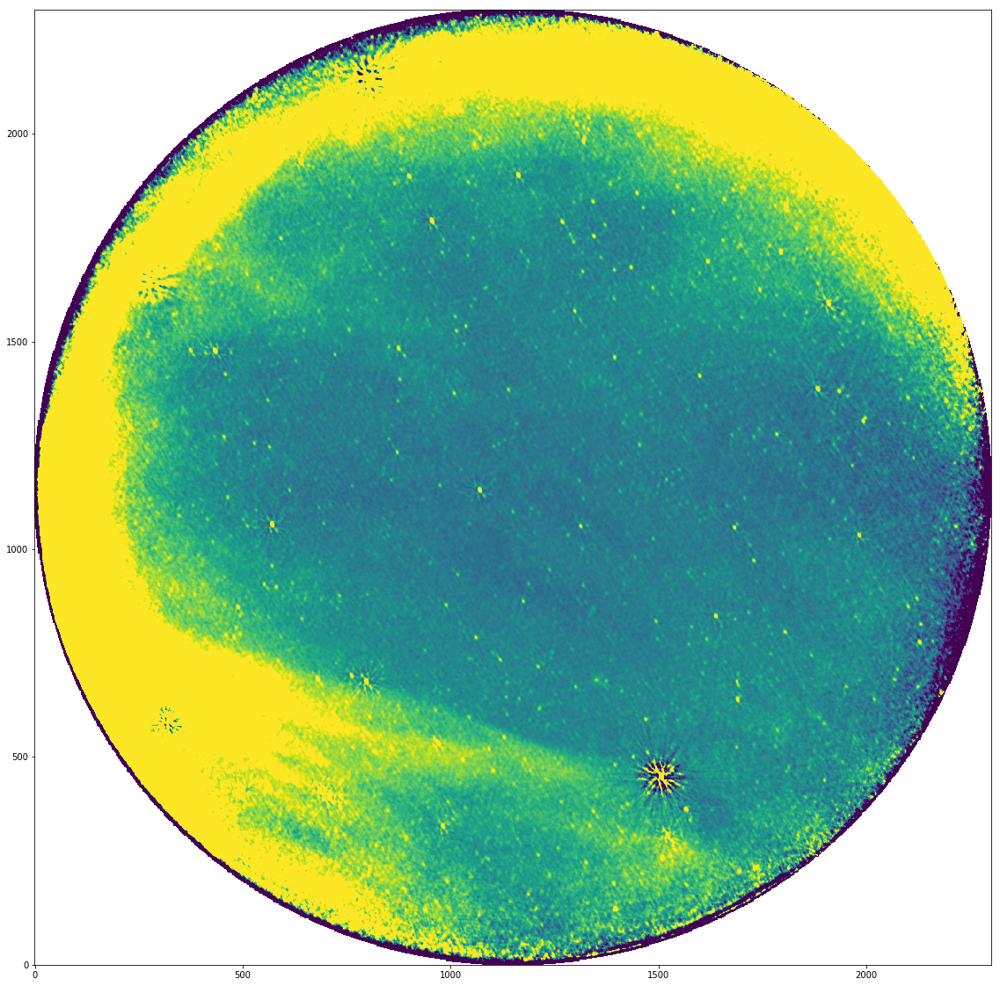

In [16]:
# img = np.median(np.array(im_stack), axis=0)
plt.figure(figsize=(20,20))
plt.imshow(img, origin="lower",
           vmin=np.mean(img[500:1500,500:1500])-3*np.std(img[500:1500,500:1500]),
           vmax=np.mean(img[500:1500,500:1500])+3*np.std(img[500:1500,500:1500]))

freq: 33.98


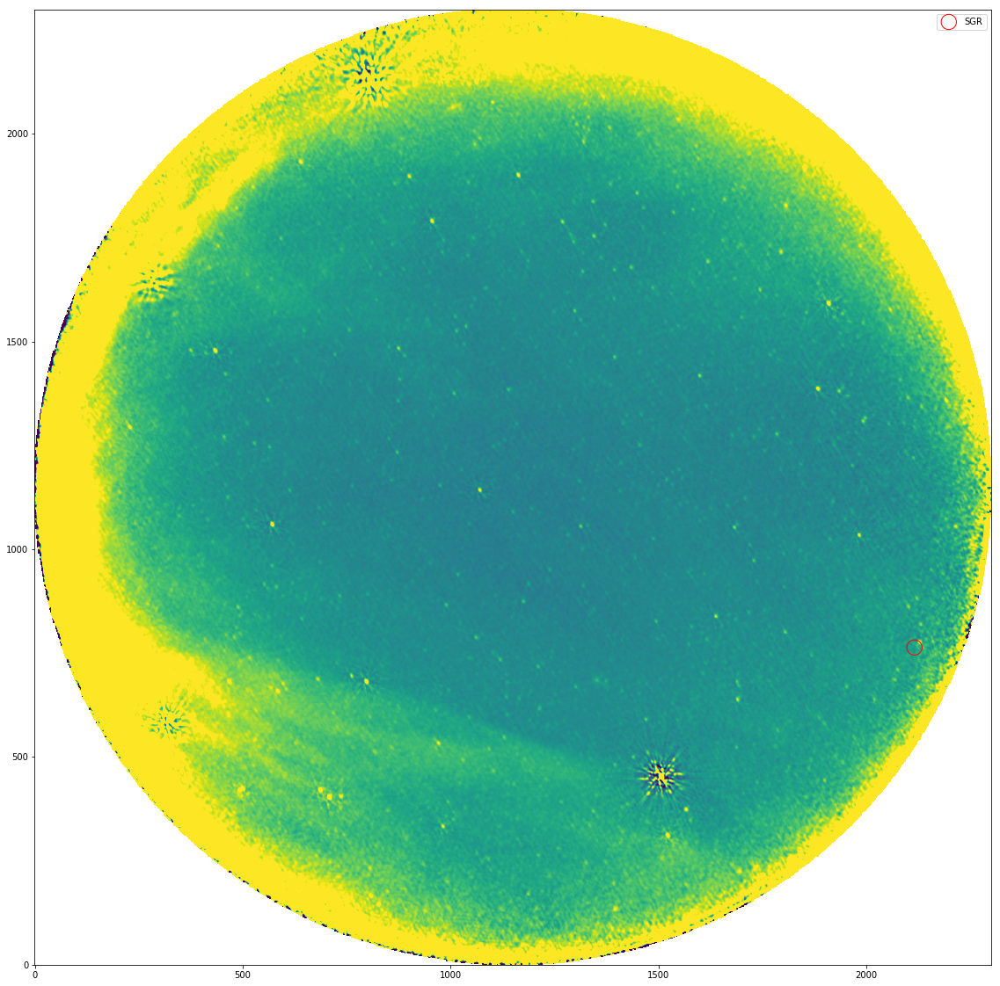

In [10]:
# images = glob.glob("/home/mkuiack1/{}*fits".format(SLICE))

# im_stack = np.zeros([2300, 2300])
# f_stack = []
# all_freqs = []
# slice_times = []
# all_std = []

# for img_file in images :

#         data, f=fits.getdata(img_file, header=True)

#         STD = np.std(data[0,0,:,:])

#         f_stack.append(f)
#         all_std.append(STD)
#         slice_times.append(f["DATE-OBS"])
        
# #         beam_model = get_beam(f[" CRVAL3"]/1e6)
        
# #         if STD < 200. and STD > 5.:
#         all_freqs.append(f[" CRVAL3"])
            
#         im_stack[:,:] += data[0,0,:,:]#/np.abs(np.median(data[0,0,:,:]))*(np.max(beam_model)/beam_model)


plt.figure(figsize=(20,20))
plt.imshow(im_stack, origin="lower",
           vmin=np.mean(im_stack[500:1500,500:1500])-6*np.std(im_stack[500:1500,500:1500]),
           vmax=np.mean(im_stack[500:1500,500:1500])+6*np.std(im_stack[500:1500,500:1500]) )


hdu_1 = fits.open(images[0])[0]

print "freq:", round(hdu_1.header['CRVAL3']/1e6,2)

wcs = WCS(hdu_1.header)
wcs = wcs.dropaxis(-1).dropaxis(-1)

spot = wcs.wcs_world2pix(148., 7.5 , 0)


# index = (cat_8C.Sint > 8.) & (cat_8C.Sint < 1000.)

# spot = wcs.wcs_world2pix(cat_8C["_RAJ2000"].loc[index].values, 
#                          cat_8C["_DEJ2000"].loc[index].values, 0)


plt.scatter(np.array(spot)[0],
         np.array(spot)[1], 
            300, facecolors='none', edgecolors='r', label="SGR")


# pysespot = wcs.wcs_world2pix(pyse["ra"].values, 
#                          pyse[" dec"].values, 0)

# plt.scatter(np.array(pysespot)[0,:],
#          np.array(pysespot)[1,:], 
#             pyse[" int_flux"].values/2., 
#             facecolors='none', edgecolors='w', label="pyse")

# plt.scatter(np.array(pysespot)[0,:],
#          np.array(pysespot)[1,:], 
#             pyse[" int_flux"].values/50., 
#             facecolors='none', edgecolors='w', label="pyse")

plt.legend()

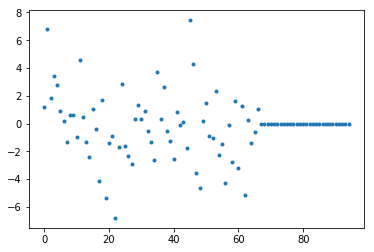

In [48]:
plt.plot(np.mean(im_stack[980:985,570:575,:],axis=(0,1)), ".")

In [470]:

hdul = fits.open(images[0])
prihdr = hdul[0].header

prihdr.update({'RESTFRQ':np.mean(all_freqs)*1e6})
prihdr.update({'RESTFREQ':np.mean(all_freqs)*1e6})
prihdr.update({'RESTBW':hdul[0].header['CDELT3']*len(all_freqs)})

prihdr.update({'DATE-OBS':min(slice_times)})

hdul[0].data[0,0,:,:] = im_stack


hdul.writeto("{}_{}_{}B-CLEAN.fits".format(SLICE, SB, int(len(all_freqs))))
# hdul.writeto("{}_ALL-CLEAN.fits".format(SLICE))



In [ ]:
glob.glob("/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:40:0*")

In [ ]:
hdul = fits.open("/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:40:0*")
prihdr = hdul[0].header

In [337]:
pyse = pd.read_csv("2020-08-13T03:52:41.0_96B_SB195-CLEAN.csv")


In [367]:
rm 2020-08-13T03:52:41.0_96B_SB195-CLEAN.fits

In [63]:
cat_8C = pd.read_csv("~/8c_cat.txt", delimiter="|", comment="#")

In [64]:


index = (cat_8C.Sint > 1) & (cat_8C.Sint < 1000.)
cat_8C = cat_8C.loc[index]

pyse_coord = SkyCoord(ra=(pyse.ra*u.degree).values,
                      dec=(pyse[' dec']*u.degree).values)

cat_8C_coord = SkyCoord(ra=(cat_8C._RAJ2000*u.degree).values,
                       dec=(cat_8C._DEJ2000*u.degree).values)

idx, d2d, d3d = pyse_coord.match_to_catalog_sky(cat_8C_coord)


NameError: name 'pyse' is not defined

0.03195016364229656 0.0007652213624800038
-3.5860244033596005 1.497070774477903
31.298744231662425


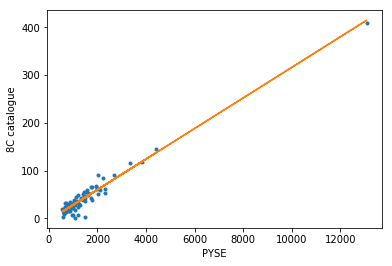

In [340]:


radius = .1

# pyse[d2d.deg < radius]

plt.plot(pyse[d2d.deg < radius][' int_flux'], 
         cat_8C.iloc[idx[d2d.deg < radius]].Sint,".")
plt.xlabel("PYSE")
plt.ylabel("8C catalogue")


fit, cov = np.polyfit(pyse[d2d.deg < radius][' int_flux'],
           cat_8C.iloc[idx[d2d.deg < radius]].Sint, 1, cov=True)

print fit[0], np.sqrt(cov[0,0])
print fit[1], np.sqrt(cov[1,1])

plt.plot(pyse[d2d.deg < radius][' int_flux'], 
         fit[0]*pyse[d2d.deg < radius][' int_flux']+fit[1])

print 1./fit[0]

NameError: name 'cat_8C' is not defined

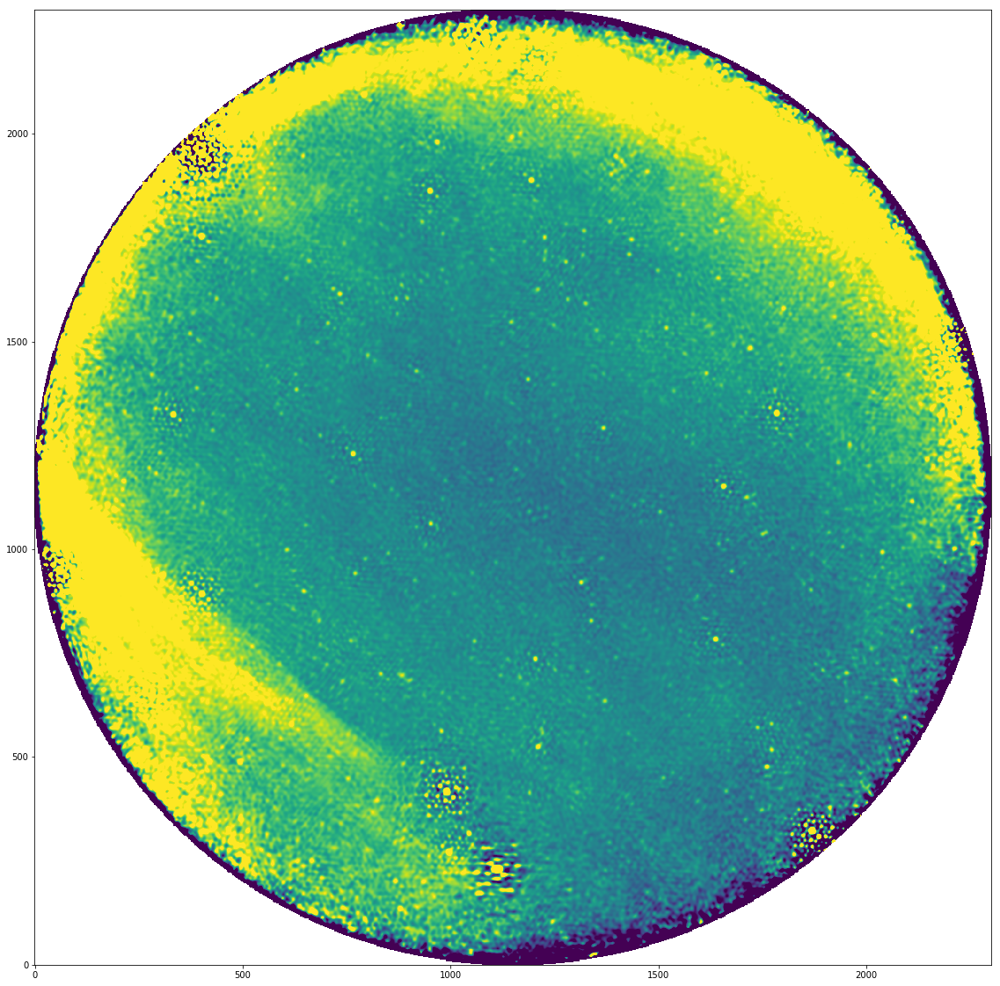

In [26]:
plt.figure(figsize=(20,20))
plt.imshow(im_stack, origin="lower",
           vmin=np.mean(im_stack[500:1500,500:1500])-5*np.std(im_stack[500:1500,500:1500]),
           vmax=np.mean(im_stack[500:1500,500:1500])+5*np.std(im_stack[500:1500,500:1500]) )

spot = wcs.wcs_world2pix(cat_8C.iloc[idx[d2d.deg < radius]]["_RAJ2000"].values, 
                         cat_8C.iloc[idx[d2d.deg < radius]]["_DEJ2000"].values, 0)


plt.scatter(np.array(spot)[0,:],
         np.array(spot)[1,:], 
            10*cat_8C.iloc[idx[d2d.deg < radius]]["Sint"].values, 
            facecolors='none', edgecolors='r', label="8C")


# pysespot = wcs.wcs_world2pix(pyse[d2d.deg < radius]["ra"].values, 
#                          pyse[d2d.deg < radius][" dec"].values, 0)

# plt.scatter(np.array(pysespot)[0,:],
#          np.array(pysespot)[1,:], 
#             pyse[d2d.deg < radius][" int_flux"].values/5., 
#             facecolors='none', edgecolors='w', label="pyse")

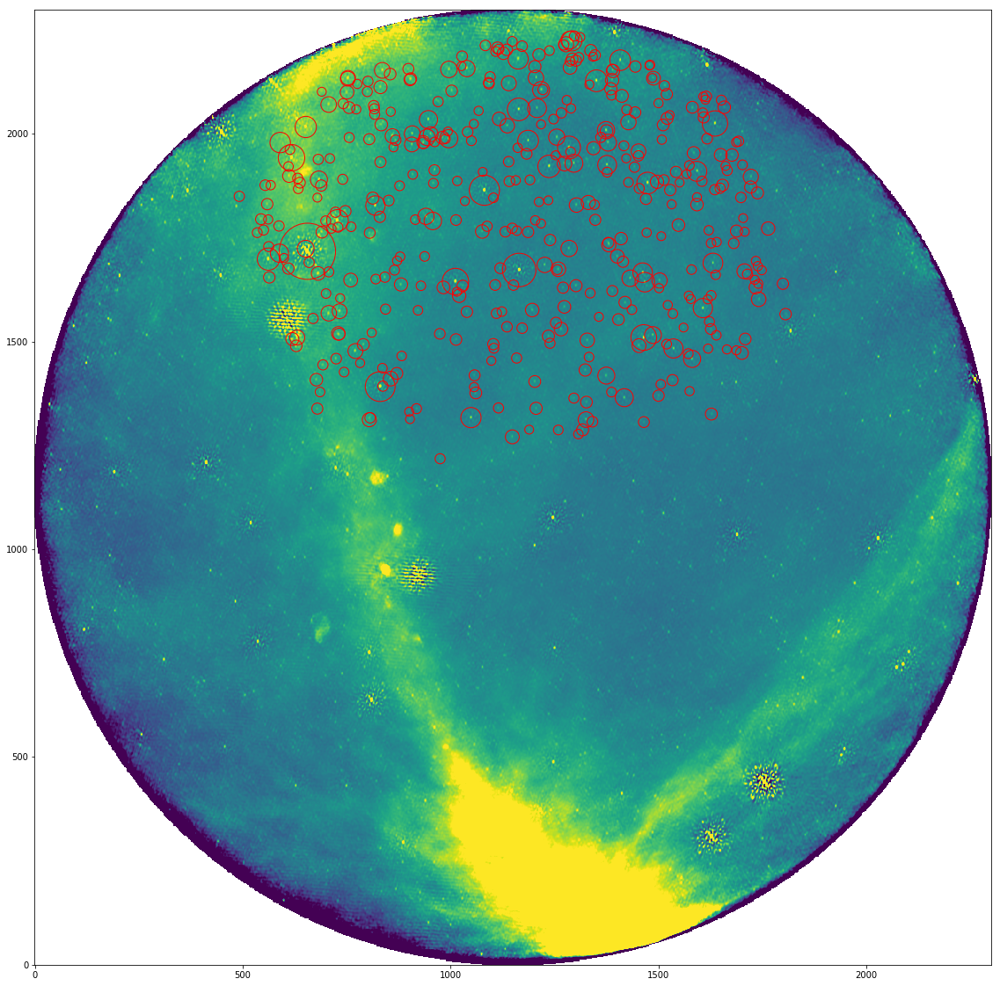

In [65]:
cat_8C = pd.read_csv("~/8c_cat.txt", delimiter="|", comment="#")
index = (cat_8C.Sint > 10) & (cat_8C.Sint < 1000.)
cat_8C = cat_8C.loc[index]

plt.figure(figsize=(20,20))
plt.imshow(im_stack, origin="lower",
           vmin=np.mean(im_stack[500:1500,500:1500])-5*np.std(im_stack[500:1500,500:1500]),
           vmax=np.mean(im_stack[500:1500,500:1500])+5*np.std(im_stack[500:1500,500:1500]) )

spot = wcs.wcs_world2pix(cat_8C["_RAJ2000"].values, 
                         cat_8C["_DEJ2000"].values, 0)


plt.scatter(np.array(spot)[0,:],
         np.array(spot)[1,:], 
            10*cat_8C["Sint"].values, 
            facecolors='none', edgecolors='r', label="8C")


In [336]:
print "{}_{}B_SB194-CLEAN.fits".format(f_stack[0]["DATE-OBS"],
                                                   int(len(all_freqs)))

2020-08-13T03:52:09.8_96B_SB194-CLEAN.fits


In [24]:
images = glob.glob("*CLEAN-dirty.fits")


starttime =  time.time()
im_stack = np.zeros([2300, 2300])
f_stack = []
all_freqs = []
slice_times = [] 
all_std = [] 

for img_file in images :

        data, f=fits.getdata(img_file, header=True)
        STD = np.std(data[0,0,:,:])

        f_stack.append(f)
        all_std.append(STD)
        slice_times.append(f["DATE-OBS"])
        
        if STD < 100. and STD > 10.:
            all_freqs.append(f["CRVAL3"])
            im_stack[:,:] += data[0,0,:,:]/np.abs(np.median(data[0,0,:,:]))


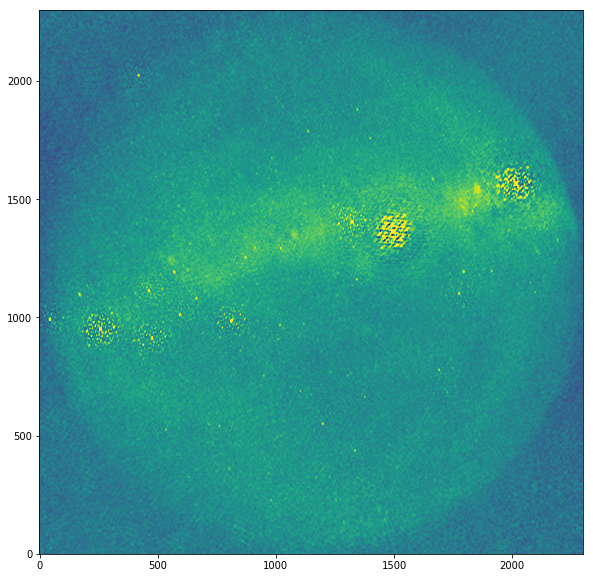

In [25]:
plt.figure(figsize=(10,10))
plt.imshow(im_stack, origin="lower",
           vmin=np.mean(im_stack)-5*np.std(im_stack),
           vmax=np.mean(im_stack)+5*np.std(im_stack) )

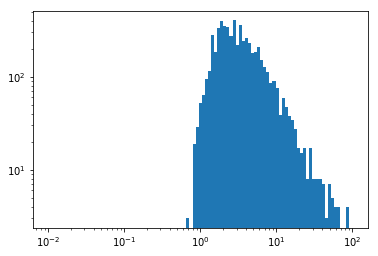

In [74]:
plt.figure()
_x = plt.hist(cat_8C.Sint,bins=np.logspace(-2,2,100), log=True)

plt.xscale("log")

In [228]:
np.sort(np.abs(38.5-np.array([30,35,40,50,55,60,65,70,75,80,85,90])))

array([ 1.5,  3.5,  8.5, 11.5, 16.5, 21.5, 26.5, 31.5, 36.5, 41.5, 46.5,
       51.5])

In [229]:
np.array([30,35,40,50,55,60,65,70,75,80,85,90])[np.argsort(np.abs(38.5-np.array([30,35,40,50,55,60,65,70,75,80,85,90])))[0]]

40

In [295]:
def get_beamfreq(freq):
    beams = np.array([30,35,40,50,55,60,65,70,75,80,85,90])
    return str(beams[np.argsort(np.abs(freq-beams))[0]])

beam_file = "/home/mkuiack1/AARTFAAC_beamsim/LBAOUTER_AARTFAAC_beamshape_{}MHz.hdf5".format(get_beamfreq(38.01))
beam_model = np.array(h5py.File(beam_file).get('lmbeamintensity_norm'))



/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:8: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  


In [268]:
np.array(h5py.File(beam_file).get('lmbeamintensity_norm'))

/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:1: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  """Entry point for launching an IPython kernel.


array(None, dtype=object)

In [290]:
beam_file = "/home/mkuiack1/AARTFAAC_beamsim/LBAOUTER_AARTFAAC_beamshape_60MHz.hdf5"
beam_model = np.array(h5py.File(beam_file).get('lmbeamintensity_norm'))



/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:2: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  


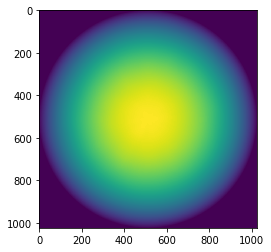

In [296]:
plt.imshow(beam_model)

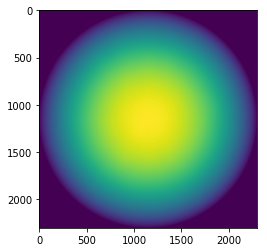

In [309]:
plt.imshow(new_orig)

In [4]:
images = glob.glob("/hddstore/mkuiack1/meteor_16SB/*.fits")


starttime =  time.time()
im_stack = np.zeros([2300, 2300])

all_std = [] 

for img_file in images :

        data, f=fits.getdata(img_file, header=True)
        STD = np.std(data[0,0,:,:])

        all_std.append(STD)


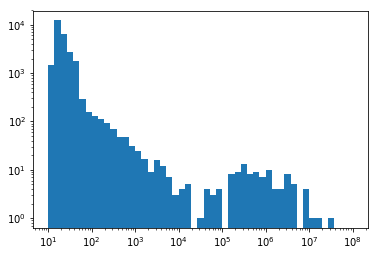

In [16]:
_x  = plt.hist(np.array(all_std), log=True, bins=np.logspace(1,8))
plt.xscale("log")

In [25]:
pd.DataFrame(np.array(images)[(np.array(all_std) < 100)])\
.to_csv("/hddstore/mkuiack1/meteor_16SB/good_images.csv", index=False)

In [34]:
images = sorted(pd.read_csv("/hddstore/mkuiack1/meteor_16SB/good_images.csv").values.ravel())

for f in images:
    print f


/hddstore/mkuiack1/meteor_16SB/2020-08-13T02:59:59.2-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T02:59:59.2-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T02:59:59.2-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T02:59:59.2-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T02:59:59.2-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T02:59:59.2-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T02:59:59.2-SB237.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T02:59:59.2-SB238.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T02:59:59.2-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T02:59:59.2-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:00:00.2-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:00:00.2-SB185.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:00:00.2-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:00:00.2-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:00:00.2-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:02.8-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:02.8-SB237.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:02.8-SB238.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:02.8-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:02.8-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:03.8-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:03.8-SB185.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:03.8-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:03.8-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:03.8-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:03.8-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:04.8-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:04.8-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:04.8-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:04:04.8-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:41.2-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:42.3-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:42.3-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:42.3-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:42.3-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:42.3-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:42.3-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:42.3-SB237.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:42.3-SB238.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:42.3-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:42.3-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:43.3-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:43.3-SB185.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:43.3-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:07:43.3-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:34.2-SB237.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:34.2-SB238.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:34.2-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:34.2-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:35.2-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:35.2-SB185.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:35.2-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:35.2-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:35.2-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:35.2-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:36.2-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:36.2-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:36.2-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:36.2-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:12:36.2-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:45.2-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:45.2-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:45.2-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:45.2-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:46.2-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:46.2-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:46.2-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:46.2-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:46.2-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:46.2-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:46.2-SB237.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:46.2-SB238.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:46.2-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:46.2-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:17:47.2-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:48.2-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:48.2-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:48.2-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:48.2-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:48.2-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:48.2-SB237.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:48.2-SB238.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:48.2-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:48.2-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:49.2-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:49.2-SB185.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:49.2-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:49.2-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:49.2-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:22:49.2-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:04.9-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:04.9-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:04.9-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:05.9-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:05.9-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:05.9-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:05.9-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:05.9-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:05.9-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:05.9-SB237.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:05.9-SB238.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:05.9-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:05.9-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:06.9-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:27:06.9-SB185.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:46.2-SB238.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:46.2-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:46.2-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:47.2-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:47.2-SB185.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:47.2-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:47.2-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:47.2-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:47.2-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:48.2-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:48.2-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:48.2-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:48.2-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:48.2-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:32:48.2-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:28.4-SB238.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:28.4-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:28.4-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:29.4-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:29.4-SB185.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:29.4-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:29.4-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:29.4-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:29.4-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:30.4-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:30.4-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:30.4-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:30.4-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:30.4-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:38:30.4-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:26.8-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:26.8-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:27.8-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:27.8-SB185.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:27.8-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:27.8-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:27.8-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:27.8-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:28.8-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:28.8-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:28.8-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:28.8-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:28.8-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:28.8-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:44:28.8-SB237.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:52.5-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:52.5-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:53.5-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:53.5-SB185.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:53.5-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:53.5-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:53.5-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:53.5-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:54.5-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:54.5-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:54.5-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:54.5-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:54.5-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:54.5-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:48:54.5-SB237.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:43.4-SB195.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:43.4-SB236.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:43.4-SB319.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:43.4-SB320.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:44.5-SB166.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:44.5-SB186.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:44.5-SB194.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:44.5-SB212.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:44.5-SB213.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:44.5-SB235.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:44.5-SB237.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:44.5-SB238.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:44.5-SB255.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:44.5-SB256.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-13T03:53:45.5-SB167.fits
/hddstore/mkuiack1/meteor_16SB/2020-08-1

In [36]:
data, f=fits.getdata(images[0], header=True)

In [48]:
# fits.open("/home/mkuiack1/mosaic-v0p3.pybdsm.srl.fits")[0].data
data, f=fits.getdata("/home/mkuiack1/mosaic-v0p3.pybdsm.srl.fits", header=True)

In [59]:
from astropy.io import fits
from astropy.table import Table
data = fits.getdata("/home/mkuiack1/mosaic-v0p3.pybdsm.srl.fits", 1)
t = Table(data).to_pandas()

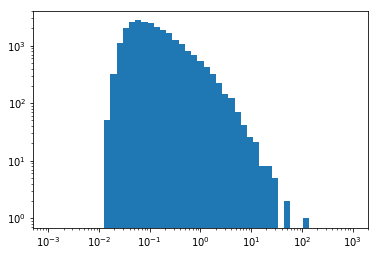

In [62]:
plt.hist(t["Total_flux"], log=True, bins=np.logspace(-3,3))  
plt.xscale("log")

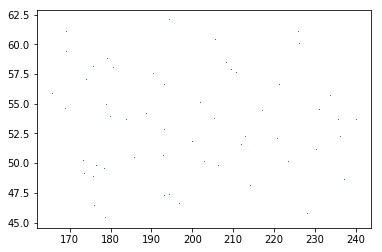

In [66]:
plt.plot(t[t.Total_flux > 10].RA, 
         t[t.Total_flux > 10].DEC, ",")

In [29]:
log = pd.read_csv("/home/mkuiack1/processingsteps.txt", delimiter=" ")
# times = pd.to_datetime([x[0][:19] for x in log.values])

In [38]:
log

# plt.plot(times)


,2020-11-25,21:55:57,INFO,tkp.main:,processing,10,images,in,timestep,2020-08-13,02:59:59.200000,(1/3229)
0,2020-11-25,21:56:19,INFO,tkp.main:,processing,6,images,in,timestep,2020-08-13,03:00:00.200000,(2/3229)
1,2020-11-25,21:56:33,INFO,tkp.main:,processing,10,images,in,timestep,2020-08-13,03:00:01.200000,(3/3229)
2,2020-11-25,21:56:52,INFO,tkp.main:,processing,6,images,in,timestep,2020-08-13,03:00:02.200000,(4/3229)
3,2020-11-25,21:57:03,INFO,tkp.main:,processing,10,images,in,timestep,2020-08-13,03:00:03.200000,(5/3229)
4,2020-11-25,21:57:21,INFO,tkp.main:,processing,6,images,in,timestep,2020-08-13,03:00:04.200000,(6/3229)
5,2020-11-25,21:57:32,INFO,tkp.main:,processing,10,images,in,timestep,2020-08-13,03:00:05.200000,(7/3229)
6,2020-11-25,21:57:50,INFO,tkp.main:,processing,6,images,in,timestep,2020-08-13,03:00:06.200000,(8/3229)
7,2020-11-25,21:58:00,INFO,tkp.main:,processing,10,images,in,timestep,2020-08-13,03:00:07.300000,(9/3229)
8,2020-11-25,21:58:18,INFO,tkp.main:,processing,6,images,in,timestep,2020-08-13,03:00:08.300000,(10/3229)
9,2020-11-25,21:58:29,INFO,tkp.main:,processing,10,images,in,timestep,2020-08-13,03:00:09.300000,(11/3229)


In [44]:
log["steptime"] = pd.to_datetime(log["2020-08-13"]+" "+log["02:59:59.200000"])

Text(0.5,0,'Timestep processed')

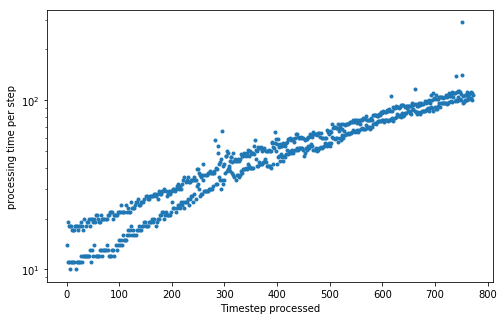

In [105]:

plt.figure(figsize=(8,5))
plt.plot(log["proctime"].diff()[~np.isnat(log["proctime"].diff())]/1e9,".", lw=0.5, )
plt.yscale("log")

plt.ylabel("processing time per step")
plt.xlabel("Timestep processed")


Text(0.5,0,'processing step')

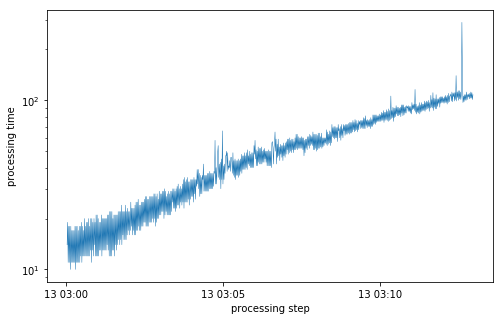

In [99]:
plt.figure(figsize=(8,5))
plt.plot(log["steptime"][1:],log["proctime"].diff()[1:]/1e9, lw=0.5)
plt.yscale("log")

plt.ylabel("processing time")
plt.xlabel("processing step")

In [91]:
blindlog = pd.read_csv("/home/mkuiack1/blindsteps.txt", delimiter=" ")

blindlog["proctime"] = pd.to_datetime(blindlog["2020-11-25"]+" "+blindlog["21:56:14"])
blindlog["sources"] = blindlog["1169"]


Text(0.5,0,'cumulative sources detected')

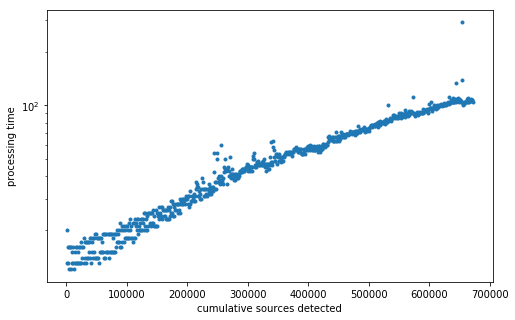

In [100]:
plt.figure(figsize=(8,5))
plt.plot(blindlog["sources"][1:].cumsum(), 
         blindlog["proctime"].diff()[1:]/1e9, ".")
plt.yscale("log")

plt.ylabel("processing time")
plt.xlabel("cumulative sources detected")

In [ ]:
subbands = np.array([156,165,174,187,195,213,221,231,243,256,257,267,278,284,296,320])

In [4]:
# subbands = np.array([281, 284, 287, 291, 294, 298, 301, 304, 
#                      308, 311, 315, 318, 321, 325, 328, 332])

subbands = np.array([156, 165, 174, 187, 195, 213, 221, 231,
                     243, 256, 257, 267, 278, 284, 296, 320])

OBS = "202012032122"

filelist = pd.DataFrame([])

for i in range(len(subbands)):
    print subbands[i]
    index = pd.to_datetime([os.path.basename(x)[:21]
                            for x in sorted(glob.glob("/zfs/helios/filer0/mkuiack1/{}/*_all/SB".format(OBS)
                                                      +str(subbands[i])
                                                      +"*/imgs/*.fits"))]).round("1s")
    
    df = pd.DataFrame({str(get_freq(subbands[i])):\
                       sorted(glob.glob("/zfs/helios/filer0/mkuiack1/{}/*_all/SB".format(OBS)
                                        +str(subbands[i])
                                        +"*/imgs/*.fits"))},
                      index=index)
    
    filelist = pd.concat([filelist, df.loc[~df.index.duplicated(keep='first')]], axis=1)

156
165
174
187
195
213
221
231
243
256
257
267
278
284
296
320


In [5]:
len(index)

7734

In [6]:

get_ddfilelist(filelist, get_freq(subbands), index[7320], 0)

['/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T23:18:39-23:21:49_all/SB156-2020-12-03T23:18:39-23:21:49/imgs/2020-12-03T23:21:11.0-SB156.fits',
 '/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T23:18:39-23:21:49_all/SB165-2020-12-03T23:18:39-23:21:49/imgs/2020-12-03T23:21:11.0-SB165.fits',
 '/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T23:18:39-23:21:49_all/SB174-2020-12-03T23:18:39-23:21:49/imgs/2020-12-03T23:21:11.0-SB174.fits',
 '/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T23:18:39-23:21:49_all/SB187-2020-12-03T23:18:39-23:21:49/imgs/2020-12-03T23:21:11.0-SB187.fits',
 '/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T23:18:39-23:21:49_all/SB195-2020-12-03T23:18:39-23:21:49/imgs/2020-12-03T23:21:11.0-SB195.fits',
 '/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T23:18:39-23:21:49_all/SB213-2020-12-03T23:18:39-23:21:49/imgs/2020-12-03T23:21:11.0-SB213.fits',
 '/zfs/helios/filer0/mkuiack1/202012032122/2020-12-03T23:18:39-23:21:49_all/SB221-2020-12-03T2

In [63]:
# frame = 0

# for fi_ind in index:
    
def make_frame(fi_ind):
    im_stack = np.zeros([2300, 2300])
    f_stack = []
    all_freqs = []
    slice_times = []
    all_std = []
    count = 0 
    psr = []

    for img_file in get_ddfilelist(filelist, get_freq(subbands), fi_ind, 0):

            try:
                data, f=fits.getdata(img_file, header=True)
            except IOError:
                print img_file
                continue  
            if os.path.exists("/hddstore/mkuiack1/png/{}.png".format(f["DATE-OBS"])):
                return 0
            STD = np.std(data[0,0,:,:])


            all_std.append(STD)
    #         print STD
            slice_times.append(f["DATE-OBS"])

            beam_model = get_beam(f[" CRVAL3"]/1e6)
            psr.append(np.mean((data[0,0,:,:]/np.abs(np.median(data[0,0,:,:]))*(np.max(beam_model)/beam_model))[1675:1685,440:450]))

            if STD < 30. and STD > 8.:
                f_stack.append(f)
                all_freqs.append(f[" CRVAL3"])

                im_stack[:,:] += data[0,0,:,:]/np.abs(np.median(data[0,0,:,:]))*(np.max(beam_model)/beam_model)
    
    fig = plt.figure(figsize=(10.8, 10.8))
    ax = plt.subplot(111)
    imgmap = plt.imshow(im_stack, origin="lower",
               vmin=np.mean(im_stack[500:1500,500:1500])-6*np.std(im_stack[500:1500,500:1500]),
               vmax=np.mean(im_stack[500:1500,500:1500])+6*np.std(im_stack[500:1500,500:1500]) )
    plt.text(.01,.98, f["DATE-OBS"], va="top", ha="left",
             fontsize=16, color="white", transform=ax.transAxes,  )
    plt.text(.01,.95, "nSB: {}".format(len(f_stack)), va="top", ha="left",
             fontsize=16, color="white", transform=ax.transAxes,  )


    imgmap.cmap.set_bad('k',1.)
    ax.patch.set_facecolor('k')

    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

    fig.savefig("/hddstore/mkuiack1/png/{}.png".format(f["DATE-OBS"]), 
                dpi=100,  bbox_inches='tight', facecolor='black')
    plt.close()
    return 0 

In [27]:
from joblib import Parallel, delayed

_out = Parallel(n_jobs=12)(delayed(make_frame)(fi_ind) for fi_ind in index)

In [9]:
im_stack = np.zeros([2300, 2300])
f_stack = []
all_freqs = []
slice_times = []
all_std = []
count = 0 
psr = []
for img_file in get_ddfilelist(filelist, get_freq(subbands), index[7320], 0):

        try:
            data, f=fits.getdata(img_file, header=True)
        except IOError:
            print img_file
            continue  

            
        STD = np.std(data[0,0,:,:])

        
        all_std.append(STD)
        print STD
        slice_times.append(f["DATE-OBS"])
        all_freqs.append(f[" CRVAL3"]/1e6)
            
        beam_model = get_beam(f[" CRVAL3"]/1e6)
        psr.append(np.mean((data[0,0,:,:]/np.abs(np.median(data[0,0,:,:]))*(np.max(beam_model)/beam_model))[1675:1685,440:450]))

        if STD < 50. and STD > 8.:
            f_stack.append(f)
 

            im_stack[:,:] += data[0,0,:,:]/np.abs(np.median(data[0,0,:,:]))*(np.max(beam_model)/beam_model)


45.70687


/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in divide
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in divide


45.08044


/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in add


39.49894
33.56767
30.599577
24.29063
20.50055
18.441065
14.8222685
53.544605
13.260107
12.695424
12.035238
11.908604
11.973051
18.116152


In [74]:
index.min(), index.max()

(Timestamp('2020-12-03 21:24:39'), Timestamp('2020-12-03 22:27:48'))

/home/mkuiack1/env/lib/python2.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


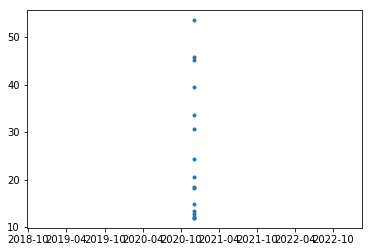

In [11]:
plt.plot(pd.to_datetime(slice_times), all_std, ".")

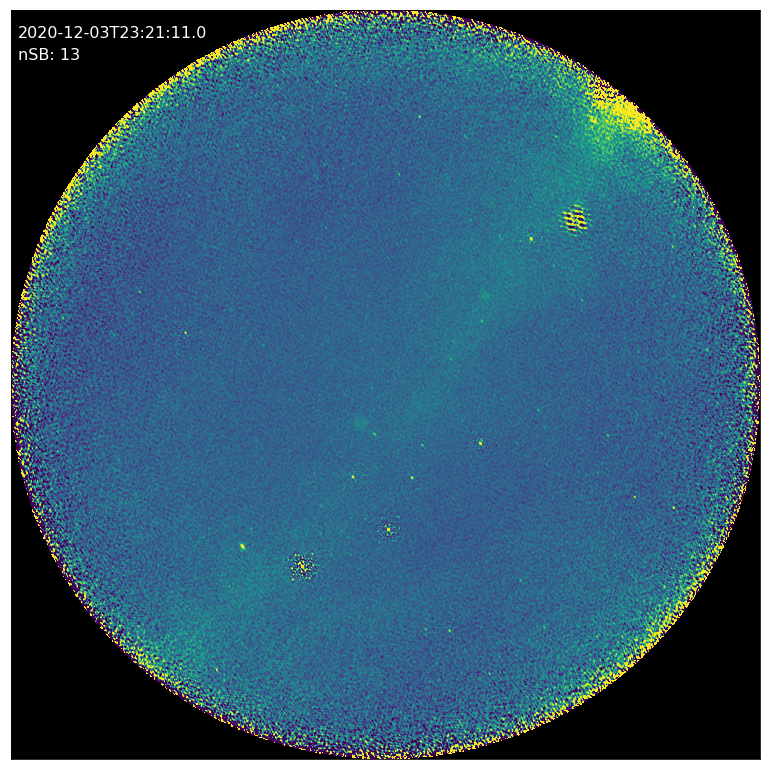

In [8]:


fig = plt.figure(figsize=(10.8, 10.8))
ax = plt.subplot(111)
imgmap = plt.imshow(im_stack, origin="lower", #cmap="tab20b",
           vmin=np.mean(im_stack[500:1500,500:1500])-5*np.std(im_stack[500:1500,500:1500]),
           vmax=np.mean(im_stack[500:1500,500:1500])+10*np.std(im_stack[500:1500,500:1500]) )


plt.text(.01,.98, f["DATE-OBS"], va="top", ha="left",
         fontsize=16, color="white", transform=ax.transAxes,  )
plt.text(.01,.95, "nSB: {}".format(len(f_stack)), va="top", ha="left",
         fontsize=16, color="white", transform=ax.transAxes,  )

plt.xticks([])
plt.yticks([])

imgmap.cmap.set_bad('k',1.)
ax.patch.set_facecolor('k')

plt.tight_layout()

# plt.savefig("/hddstore/mkuiack1/normal.png".format(f["DATE-OBS"]), 
#                 dpi=100, facecolor='black')